In [1]:
import scanpy as sc

import muon as mu

from muon import atac as ac
from muon import prot as pt

import scipy
import numpy as np 
import pandas as pd
 
from matplotlib import pyplot as plt
import seaborn as sns

import pandas as pd

2025-04-24 07:26:24.229832: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-24 07:26:27.773874: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
def write_dataset(data, path, sep='\t', header=True, index=True, compression=None):
    """
    See pandas.to_csv documentation - this is just a wrapper
    :param data: data to save
    :param path: str or Path object, path to save
    :param sep:
    :param header:
    :param index:
    :param compression:
    :return:
    """
    from pathlib import Path

    if isinstance(path, str):
        path = Path(path)

    output_dir = path.parents[0]
    output_dir.mkdir(parents=True, exist_ok=True)

    return data.to_csv(
        path, sep=sep, header=header, index=index, compression=compression
    )

In [3]:
sc.__version__

'1.10.1'

In [4]:
def axis_net(x, y, title='', x_len=4, y_len=4, title_y=1, gridspec_kw=None):
    """
    Return an axis iterative for subplots arranged in a net
    :param x: int, number of subplots in a row
    :param y: int, number of subplots in a column
    :param title: str, plot title
    :param x_len: float, width of a subplot in inches
    :param y_len: float, height of a subplot in inches
    :param gridspec_kw: is used to specify axis ner with different rows/cols sizes.
            A dict: height_ratios -> list + width_ratios -> list
    :param title_y: absolute y position for suptitle
    :return: axs.flat, numpy.flatiter object which consists of axes (for further plots)
    """
    if x == y == 1:
        fig, ax = plt.subplots(figsize=(x * x_len, y * y_len))
        af = ax
    else:
        fig, axs = plt.subplots(
            y, x, figsize=(x * x_len, y * y_len), gridspec_kw=gridspec_kw
        )
        af = axs.flat

    fig.suptitle(title, y=title_y)
    return af



#sc.pl.umap(adata_aggregated, color=['sample','phase' ], color_map='Blues', )

In [5]:
def bot_bar_plot(
    data,
    palette=None,
    lrot=0,
    figsize=(5, 5),
    title='',
    ax=None,
    order=None,
    stars=False,
    percent=False,
    pvalue=False,
    p_digits=5,
    legend=True,
    xl=True,
    offset=-0.1,
    linewidth=0,
    align='center',
    bar_width=0.9,
    edgecolor=None,
    hide_grid=True,
    draw_horizontal=False,
    plot_all_borders=True,
    **kwargs
):
    """
    Plot a stacked bar plot based on contingency table

    Parameters
    ----------
    data: pd.DataFrame
        contingency table for plotting. Each element of index corresponds to a bar.
    palette: dict
        palette for plotting. Keys are unique values from groups, entries are color hexes
    lrot: float
        rotation angle of bar labels in degrees
    figsize: (float, float)
        figure size in inches
    title: str
        plot title
    ax: matplotlib axis
        axis to plot on
    order: list
        what order to plot the stacks of each bar in. Contains column labels of "data"
    stars: bool
        whether to use the star notation for p value instead of numerical value
    percent: bool
        whether to normalize each bar to 1
    pvalue: bool
        whether to add the p value (chi2 contingency test) to the plot title.
    p_digits: int
        number of digits to round the p value to
    legend: bool
        whether to plot the legend
    xl: bool
        whether to plot bar labels (on x axis for horizontal plot, on y axis for vertical plot)
    hide_grid: bool
        whether to hide grid on plot
    draw_horizontal: bool
        whether to draw horizontal bot bar plot
    plot_all_borders: bool
        whether to plot top and right border

    Returns
    -------
    matplotlib axis
    """
    from matplotlib.ticker import FuncFormatter

    if ax is None:
        _, ax = plt.subplots(figsize=figsize)

    if pvalue:
        from scipy.stats import chi2_contingency

        chi2_test_data = chi2_contingency(data)
        p = chi2_test_data[1]
        if title is not False:
            title += '\n' + get_pvalue_string(p, p_digits, stars=stars)

    if percent:
        c_data = data.apply(lambda x: x * 1.0 / x.sum(), axis=1)
        if title:
            title = '% ' + title
        ax.set_ylim(0, 1)
    else:
        c_data = data

    c_data.columns = [str(x) for x in c_data.columns]

    if order is None:
        order = c_data.columns
    else:
        order = [str(x) for x in order]

    if palette is None:
        c_palette = lin_colors(pd.Series(order))

        if len(order) == 1:
            c_palette = {order[0]: blue_color}
    # else:
    #     c_palette = {str(k): v for k, v in palette.items()}

    if edgecolor is not None:
        edgecolor = [edgecolor] * len(c_data)

    kind_type = 'bar'
    if draw_horizontal:
        kind_type = 'barh'

    c_data[order].plot(
        kind=kind_type,
        stacked=True,
        position=offset,
        width=bar_width,
        color=palette,
        ax=ax,
        linewidth=linewidth,
        align=align,
        edgecolor=edgecolor,
    )

    ax = bot_bar_plot_prettify_axis(
        ax,
        c_data,
        legend,
        draw_horizontal,
        xl,
        lrot,
        title,
        hide_grid,
        plot_all_borders,
        **kwargs
    )

    if percent:
        ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0%}'.format(y)))

    return ax

def bot_bar_plot_prettify_axis(ax, c_data, legend, draw_horizontal, xl, lrot, title, hide_grid, plot_all_borders,
                               **kwargs):
    """
    Change some properties of bot_bar_plot ax

    Returns
    -------
    prettified axis
    """

    if legend:
        ax.legend(bbox_to_anchor=(1, 1), loc=2, borderaxespad=0.1)
    else:
        ax.legend_.remove()

    if 'ylabel' in kwargs.keys():
        ax.set(ylabel=kwargs['ylabel'])

    if 'xlabel' in kwargs.keys():
        ax.set(xlabel=kwargs['xlabel'])

    if not draw_horizontal:
        ax.set_xticks(np.arange(len(c_data.index)) + 0.5)
        if xl:
            ax.set_xticklabels(c_data.index, rotation=lrot)
        else:
            ax.set_xticklabels([])
    else:
        ax.set_yticks(np.arange(len(c_data.index)) + 0.5)
        if xl:
            ax.set_yticklabels(c_data.index, rotation=lrot)
        else:
            ax.set_yticklabels([])

    if title is not False:
        ax.set_title(title)

    if hide_grid:
        ax.grid(False)

    sns.despine(ax=ax)

    if plot_all_borders:
        ax.spines['top'].set_visible(True)
        ax.spines['right'].set_visible(True)

    return ax
def pivot_vectors(vec1, vec2, na_label_1=None, na_label_2=None):
    """
    Aggregates 2 vectors into a table with amount of pairs (vec1.x, vec2.y) in a cell
    Both series must have same index.
    Else different indexes values will be counted in a_label_1/na_label_2 columns if specified or ignored
    :param vec1: pd.Series
    :param vec2: pd.Series
    :param na_label_1: How to name NA column
    :param na_label_2: How to name NA row
    :return: pivot table
    """

    name1 = str(vec1.name)
    if vec1.name is None:
        name1 = 'V1'

    name2 = str(vec2.name)
    if vec2.name is None:
        name2 = 'V2'

    if name1 == name2:
        name1 += '_1'
        name2 += '_2'

    sub_df = pd.DataFrame({name1: vec1, name2: vec2})
    # FillNAs
    fill_dict = {}
    if na_label_1 is not None:
        fill_dict[name1] = na_label_1
    if na_label_2 is not None:
        fill_dict[name2] = na_label_2
    sub_df.fillna(value=fill_dict, inplace=True)

    sub_df = sub_df.assign(N=item_series(1, sub_df))

    return (
        pd.pivot_table(data=sub_df, columns=name1, index=name2, values='N', aggfunc=sum)
        .fillna(0)
        .astype(int)
    )
def item_series(item, indexed=None):
    """
    Creates a series filled with item with indexes from indexed (if Series-like) or numerical indexes (size=indexed)
    :param item: value for filling
    :param indexed:
    :return:
    """
    if indexed is not None:
        if hasattr(indexed, 'index'):
            return pd.Series([item] * len(indexed), index=indexed.index)
        elif type(indexed) is int and indexed > 0:
            return pd.Series([item] * indexed, index=np.arange(indexed))
    return pd.Series()

def lin_colors(
    factors_vector,
    cmap='default',
    sort=True,
    min_v=0,
    max_v=1,
    linspace=True,
    lighten_color=None,
):
    """
    Return dictionary of unique features of "factors_vector" as keys and color hexes as entries
    :param factors_vector: pd.Series
    :param cmap: matplotlib.colors.LinearSegmentedColormap, which colormap to base the returned dictionary on
        default - matplotlib.cmap.hsv with min_v=0, max_v=.8, lighten_color=.9
    :param sort: bool, whether to sort the unique features
    :param min_v: float, for continuous palette - minimum number to choose colors from
    :param max_v: float, for continuous palette - maximum number to choose colors from
    :param linspace: bool, whether to spread the colors from "min_v" to "max_v"
        linspace=False can be used only in discrete cmaps
    :param lighten_color: float, from 0 to +inf: 0 - very dark (just black), 1 - original color, >1 - brighter color
    :return: dict
    """

    unique_factors = factors_vector.dropna().unique()
    if sort:
        unique_factors = np.sort(unique_factors)

    if cmap == 'default':
        cmap = plt.cm.rainbow
        max_v = 0.92

    if linspace:
        cmap_colors = cmap(np.linspace(min_v, max_v, len(unique_factors)))
    else:
        cmap_colors = np.array(cmap.colors[: len(unique_factors)])

    if lighten_color is not None:
        cmap_colors = [x * lighten_color for x in cmap_colors]
        cmap_colors = np.array(cmap_colors).clip(0, 1)

    return dict(
        list(zip(unique_factors, [plt.colors.to_hex(x) for x in cmap_colors]))
    )
def round_to_1(x):
    """
    Round "x" to first significant digit
    :param x: float
    :return: float
    """
    from math import floor, log10

    return round(x, -int(floor(log10(abs(x)))))

def star_pvalue(pvalue, lev1=0.05, lev2=0.01, lev3=0.001):
    """
    Return star notation for p value
    :param pvalue: float
    :param lev1: float, '*' threshold
    :param lev2: float, '**' threshold
    :param lev3: float, '***' threshold
    :return: str
    """
    if pvalue < lev3:
        return '***'
    if pvalue < lev2:
        return '**'
    if pvalue < lev1:
        return '*'
    return '-'


def to_common_samples(df_list=()):
    """
    Accepts a list of dataframe/series-s. Returns all dataframe/series-s with intersected indexes in the same order
    :param df_list: list of pd.DataFrame/pd.Series
    :return: pd.DataFrame
    """
    cs = set(df_list[0].index)
    for i in range(1, len(df_list)):
        cs = cs.intersection(df_list[i].index)

    if len(cs) < 1:
        warnings.warn('No common samples!')
    return [df_list[i].loc[list(cs)] for i in range(len(df_list))]

def get_pvalue_string(p, p_digits=3, stars=False, prefix='p-value'):
    """
    Return string with p-value, rounded to p_digits
    :param stars: Display pvalue as stars
    :param p: float, p-value
    :param p_digits: int, default 4, number of digits to round p-value
    :param prefix:
    :return: str, p-value info string
    """
    significant_pvalue = 10**-p_digits
    if stars:
        pvalue_str = star_pvalue(p, lev3=10**-p_digits)
    else:
        if p < significant_pvalue:
            if len(prefix):
                prefix += ' < '
            pvalue_str = f'{prefix}{significant_pvalue}'
        else:
            if len(prefix):
                prefix += ' = '
            if p < 0.00001:
                pvalue_str = f'{prefix}{round_to_1(p):.0e}'
            else:
                pvalue_str = f'{prefix}{round_to_1(p)}'
    return pvalue_str

def boxplot_with_pvalue(
    data,
    grouping,
    title='',
    ax=None,
    figsize=None,
    swarm=True,
    p_digits=3,
    stars=True,
    violin=False,
    palette=None,
    order=None,
    y_min=None,
    y_max=None,
    s=7,
    p_fontsize=16,
    xlabel=None,
    **kwargs,
):
    """
    Plots boxplot or violin plot with pairwise comparisons
    :param data: pd.Series, series with numerical data
    :param grouping: pd.Series, series with categorical data
    :param title: str, plot title
    :param ax: matplotlib axis, axis to plot on
    :param figsize: (float, float), figure size in inches
    :param swarm: bool, whether to plot a swarm in addition to boxes
    :param p_digits: int, number of digits to round p value to
    :param stars: bool, whether to plot star notation instead of number for p value
    :param violin: bool, whether to do a violin plot
    :param palette: dict, palette for plotting. Keys are unique values from groups, entries are color hexes
    :param order: list, order to plot the entries in. Contains ordered unique values from "grouping"
    :param y_min: float, vertical axis minimum
    :param y_max:float, vertical axis maximum
    :param s: float, size of dots in swarmplot
    :param p_fontsize: float, font size for p value labels
    :param kwargs:
    :return: matplotlib axis
    """

    from scipy.stats import mannwhitneyu

    if data.index.duplicated().any() | grouping.index.duplicated().any():
        raise Exception('Indexes contain duplicates')

    cdata, cgrouping = to_common_samples([data.dropna(), grouping.dropna()])

    if len(cgrouping.dropna().unique()) < 2:
        raise Exception(
            'Less from 2 classes provided: {}'.format(len(cgrouping.unique()))
        )

    if order is None:
        order = cgrouping.dropna().unique()

    if ax is None:
        if figsize is None:
            figsize = (1.2 * len(order), 4)
        _, ax = plt.subplots(figsize=figsize)

    if not violin:
        sns.boxplot(
            y=cdata,
            x=cgrouping,
            ax=ax,
            palette=palette,
            order=order,
            fliersize=0,
            **kwargs,
        )
    else:
        sns.violinplot(
            y=cdata, x=cgrouping, ax=ax, palette=palette, order=order, **kwargs
        )

        # Ignoring swarm setting since violin performs same function
        swarm = False

    if swarm:
        sns.swarmplot(y=cdata, x=cgrouping, ax=ax, color=".25", order=order, s=s)

    pvalues = []
    for g1, g2 in zip(order[:-1], order[1:]):
        samples_g1 = cgrouping[cgrouping == g1].index
        samples_g2 = cgrouping[cgrouping == g2].index
        try:
            if len(samples_g1) and len(samples_g2):
                pv = mannwhitneyu(
                    cdata.loc[samples_g1],
                    cdata.loc[samples_g2],
                    alternative='two-sided',
                ).pvalue
            else:
                pv = 1
        except ValueError:
            pv = 1
        pvalues.append(pv)

    y_max = y_max or max(cdata)
    y_min = y_min or min(cdata)
    effective_size = y_max - y_min
    plot_y_limits = (y_min - effective_size * 0.15, y_max + effective_size * 0.2)

    if p_digits > 0:

        pvalue_line_y_1 = y_max + effective_size * 0.05
        if figsize is None:
            figsize = define_ax_figsize(ax)
        pvalue_text_y_1 = pvalue_line_y_1 + 0.25 * effective_size / figsize[1]

        for pos, pv in enumerate(pvalues):
            pvalue_str = get_pvalue_string(pv, p_digits, stars=stars)
            pvalue_text_y_1_local = pvalue_text_y_1

            if pvalue_str == '-':
                pvalue_text_y_1_local += 0.1 * effective_size / figsize[1]

            bar_fraction = str(0.25 / 2.0 / (figsize[0] / float(len(order))))

            ax.annotate(
                "",
                xy=(pos + 0.1, pvalue_line_y_1),
                xycoords='data',
                xytext=(pos + 0.9, pvalue_line_y_1),
                textcoords='data',
                arrowprops=dict(
                    arrowstyle="-",
                    ec='#000000',
                    connectionstyle="bar,fraction={}".format(bar_fraction),
                ),
            )
            ax.text(
                pos + 0.5,
                pvalue_text_y_1_local,
                pvalue_str,
                fontsize=p_fontsize,
                horizontalalignment='center',
                verticalalignment='center',
            )

    ax.set_title(title)
    ax.set_ylim(plot_y_limits)

    if xlabel is not None:
        ax.set_xlabel(xlabel)

    return ax


In [6]:
!pwd

/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT02/Perimarginal


In [7]:
# Define the base directory
BASE_DIR = '/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT02/Perimarginal'

In [8]:
SEED = 12
import numpy as np
import random
import tensorflow as tf

np.random.seed(SEED)
random.seed(SEED)
tf.random.set_seed(SEED)

## BTROHT_01

In [79]:
mdata_perimarginal = mu.read_10x_h5("/group/sottoriva/00-PROCESSED_DATA/2023-ROVIGO/BTROHT02/BTROHT02_perimarginal_tissue/multiome/LAZ_314/filtered_feature_bc_matrix.h5")
mdata_perimarginal

Added `interval` annotation for features from /group/sottoriva/00-PROCESSED_DATA/2023-ROVIGO/BTROHT02/BTROHT02_perimarginal_tissue/multiome/LAZ_314/filtered_feature_bc_matrix.h5
Added peak annotation from /group/sottoriva/00-PROCESSED_DATA/2023-ROVIGO/BTROHT02/BTROHT02_perimarginal_tissue/multiome/LAZ_314/atac_peak_annotation.tsv to .uns['atac']['peak_annotation']
Added gene names to peak annotation in .uns['atac']['peak_annotation']
Located fragments file: /group/sottoriva/00-PROCESSED_DATA/2023-ROVIGO/BTROHT02/BTROHT02_perimarginal_tissue/multiome/LAZ_314/atac_fragments.tsv.gz


[W::hts_idx_load3] The index file is older than the data file: /group/sottoriva/00-PROCESSED_DATA/2023-ROVIGO/BTROHT02/BTROHT02_perimarginal_tissue/multiome/LAZ_314/atac_fragments.tsv.gz.tbi


MuData object with n_obs × n_vars = 5664 × 135339
  var:	'gene_ids', 'feature_types', 'genome', 'interval'
  2 modalities
    rna:	5664 x 36601
      var:	'gene_ids', 'feature_types', 'genome', 'interval'
    atac:	5664 x 98738
      var:	'gene_ids', 'feature_types', 'genome', 'interval'
      uns:	'atac', 'files'

In [80]:
mdata_perimarginal

MuData object with n_obs × n_vars = 5664 × 135339
  var:	'gene_ids', 'feature_types', 'genome', 'interval'
  2 modalities
    rna:	5664 x 36601
      var:	'gene_ids', 'feature_types', 'genome', 'interval'
    atac:	5664 x 98738
      var:	'gene_ids', 'feature_types', 'genome', 'interval'
      uns:	'atac', 'files'

In [81]:
mdata_perimarginal.var

,gene_ids,feature_types,genome,interval
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38,chr1:29553-30267
FAM138A,ENSG00000237613,Gene Expression,GRCh38,chr1:36080-36081
OR4F5,ENSG00000186092,Gene Expression,GRCh38,chr1:65418-69055
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,chr1:120931-133723
AL627309.3,ENSG00000239945,Gene Expression,GRCh38,chr1:91104-91105
...,...,...,...,...
KI270711.1:9014-9620,KI270711.1:9014-9620,Peaks,GRCh38,KI270711.1:9014-9620
KI270713.1:21480-22396,KI270713.1:21480-22396,Peaks,GRCh38,KI270713.1:21480-22396
KI270713.1:25982-26796,KI270713.1:25982-26796,Peaks,GRCh38,KI270713.1:25982-26796
KI270713.1:31316-32231,KI270713.1:31316-32231,Peaks,GRCh38,KI270713.1:31316-32231


In [82]:
mdata_perimarginal.var_names_make_unique()
rna_perimarginal = mdata_perimarginal.mod['rna']
rna_perimarginal

AnnData object with n_obs × n_vars = 5664 × 36601
    var: 'gene_ids', 'feature_types', 'genome', 'interval'

In [83]:
atac = mdata_perimarginal.mod['atac'] 
atac

AnnData object with n_obs × n_vars = 5664 × 98738
    var: 'gene_ids', 'feature_types', 'genome', 'interval'
    uns: 'atac', 'files'

In [84]:
## Save Raw ATAC abd Raw mdata

In [85]:
BASE_DIR

'/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT02/Perimarginal'

## Save Raw ATAC and Raw mdata

In [86]:
# Save the file
mdata_perimarginal.write(f'{BASE_DIR}/BTROHT02_1_peri_mdata_rna_atac.h5ad')

... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'interval' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'interval' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


In [87]:
# Save the file
rna_perimarginal.write(f'{BASE_DIR}/BTROHT02_2_peri_raw_rna.h5ad')

In [88]:
atac.write(f'{BASE_DIR}/BTROHT02_3_peri_raw_atac.h5ad')

## Reading the RNA-data

In [89]:
rna_perimarginal = sc.read(f'{BASE_DIR}/BTROHT02_2_peri_raw_rna.h5ad')

In [90]:
atac = sc.read(f'{BASE_DIR}/BTROHT02_3_peri_raw_atac.h5ad')

## Opening the Count Matrics

In [91]:
rna_perimarginal.X

<5664x36601 sparse matrix of type '<class 'numpy.float32'>'
	with 3621247 stored elements in Compressed Sparse Row format>

In [92]:
dense_matrix = rna_perimarginal.X.toarray()  # Convert to a dense NumPy array
print(dense_matrix)  # Display the entire matrix

print(dense_matrix[:45, :500])  # View the first 45 rows and 500 columns

import pandas as pd

# Create a DataFrame with genes as columns and cells as rows
matrix_df = pd.DataFrame(
    dense_matrix, 
    index=rna_perimarginal.obs_names,  # Cell IDs
    columns=rna_perimarginal.var_names  # Gene names
)

# View the DataFrame
print(matrix_df)

# Display the column for the gene FAM138A
print(matrix_df["FAM138A"])


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
                    MIR1302-2HG  FAM138A  OR4F5  AL627309.1  AL627309.3  \
AAACAGCCAGGTTTGC-1          0.0      0.0    0.0         0.0         0.0   
AAACATGCAACCCTCC-1          0.0      0.0    0.0         0.0         0.0   
AAACATGCACTAAGAA-1          0.0      0.0    0.0         0.0         0.0   
AAACATGCAGTAAAGC-1          0.0      0.0    0.0         0.0         0.0   
AAACCAACATGTCGCG-1          0.0      0.0    0.0         0.0         0.0   
...                         ...      ...    ...         ...         ...   
TTTGTGTTCGCACAAT-1          0.0      0.0    0.0         0.0         0.0   
TTTGTTGGTAGGATTT-1          0.0      0.0    0.0         0.0         0.0   
TTTGTTGGTCAAA

In [93]:
print(rna_perimarginal.X)
rna_perimarginal.X.shape

  (0, 99)	1.0
  (0, 187)	1.0
  (0, 226)	1.0
  (0, 298)	1.0
  (0, 524)	1.0
  (0, 621)	1.0
  (0, 639)	1.0
  (0, 657)	1.0
  (0, 754)	1.0
  (0, 853)	1.0
  (0, 1073)	1.0
  (0, 1205)	2.0
  (0, 1261)	1.0
  (0, 1283)	1.0
  (0, 1407)	1.0
  (0, 1450)	1.0
  (0, 1593)	2.0
  (0, 1690)	1.0
  (0, 1717)	1.0
  (0, 2087)	1.0
  (0, 2293)	1.0
  (0, 2539)	2.0
  (0, 2543)	1.0
  (0, 2544)	1.0
  (0, 2870)	1.0
  :	:
  (5663, 35738)	1.0
  (5663, 35768)	1.0
  (5663, 35828)	1.0
  (5663, 35837)	1.0
  (5663, 35861)	2.0
  (5663, 35907)	1.0
  (5663, 35921)	2.0
  (5663, 35993)	1.0
  (5663, 35994)	1.0
  (5663, 35998)	7.0
  (5663, 36042)	1.0
  (5663, 36077)	1.0
  (5663, 36099)	1.0
  (5663, 36103)	1.0
  (5663, 36112)	1.0
  (5663, 36137)	1.0
  (5663, 36140)	2.0
  (5663, 36314)	1.0
  (5663, 36375)	1.0
  (5663, 36376)	1.0
  (5663, 36452)	1.0
  (5663, 36492)	1.0
  (5663, 36495)	2.0
  (5663, 36500)	3.0
  (5663, 36564)	1.0


(5664, 36601)

## QC 

In [94]:
rna_perimarginal.var['mt'] = rna_perimarginal.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(rna_perimarginal, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

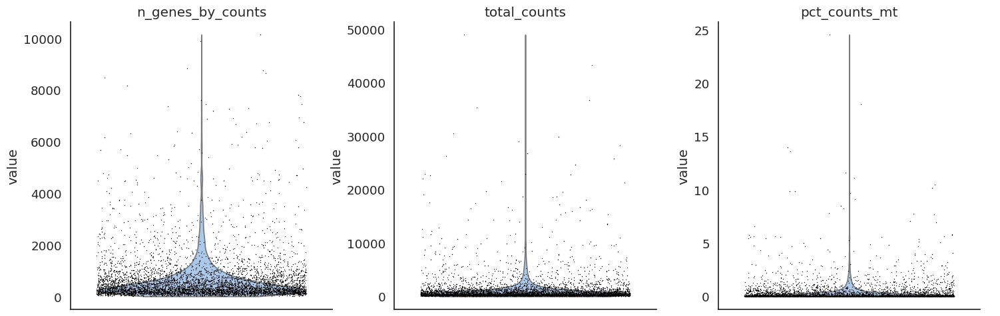

In [95]:
import scanpy as sc
import matplotlib.pyplot as plt

save_path = 'QC_RNA_before_filtration.pdf'
sc.pl.violin(rna_perimarginal, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True, save=save_path)

In [96]:
#conda install scikit-image=0.24.0 --no-channel-priority

new_perimarginal = sc.pp.scrublet(rna_perimarginal, adata_sim=None, batch_key=None, sim_doublet_ratio=2.0, expected_doublet_rate=0.05, stdev_doublet_rate=0.02, synthetic_doublet_umi_subsampling=1.0, knn_dist_metric='euclidean', normalize_variance=True, log_transform=False, mean_center=True, n_prin_comps=30, use_approx_neighbors=None, get_doublet_neighbor_parents=False, n_neighbors=None, threshold=None, verbose=True, copy=True, random_state=0)


In [97]:
# Count the total number of entries in 'predicted_doublet'
total_count = new_perimarginal.obs['predicted_doublet'].count()

# Count the number of True values in 'predicted_doublet'
true_count = new_perimarginal.obs['predicted_doublet'].sum()

# Calculate the proportion of True values
true_proportion = true_count / total_count if total_count > 0 else 0

# Display the results
print(f"Total entries: {total_count}")
print(f"Number of True values: {true_count}")
print(f"Proportion of True values: {true_proportion:.2%}")


Total entries: 5664
Number of True values: 1
Proportion of True values: 0.02%


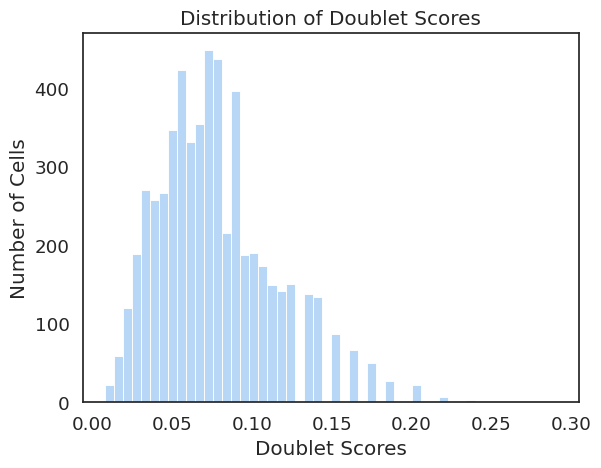

In [98]:
import matplotlib.pyplot as plt
import seaborn as sns

# Access doublet scores
doublet_scores = new_perimarginal.obs['doublet_score']

# Plot histogram using seaborn for better aesthetics (or use plt.hist)
sns.histplot(doublet_scores, bins=50, kde=False)
plt.xlabel('Doublet Scores')
plt.ylabel('Number of Cells')
plt.title('Distribution of Doublet Scores')
plt.show()

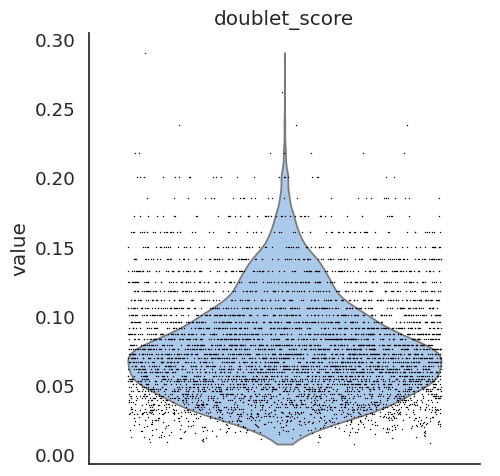

In [99]:
sc.pl.violin(new_perimarginal, ['doublet_score'], jitter=0.4, multi_panel=True, save=save_path)

## Filtration

In [100]:
mu.pp.filter_obs(rna_perimarginal, 'n_genes_by_counts', lambda x: (x >= 300))
# This is analogous to
#   sc.pp.filter_cells(rna, min_genes=200)
#   rna = rna[rna.obs.n_genes_by_counts < 5000, :]
# but does in-place filtering avoiding copying the object

#mu.pp.filter_obs(rna, 'total_counts', lambda x: x < 10000)
mu.pp.filter_obs(rna_perimarginal, 'pct_counts_mt', lambda x: x < 5)

In [101]:
# Initialize the dictionary to store all results
metrics = {}

# QC metrics
metrics["rna_n_genes_by_counts_top"] = None
metrics["rna_n_genes_by_counts_bottom"] = 300
metrics["rna_total_counts_top"] = None
metrics["rna_total_counts_bottom"] = None
metrics["rna_pct_counts_mt"] = 5

# Print QC metrics section
print("QC metrics:")
for key, value in metrics.items():
    print(f"{key}: {value}")

# Part 1: RNA Metrics
metrics["rna_perimarginal_min_total_counts"] = rna_perimarginal.obs['total_counts'].min()
metrics["rna_perimarginal_mean_total_counts"] = rna_perimarginal.obs['total_counts'].mean()
metrics["rna_perimarginal_max_total_counts"] = rna_perimarginal.obs['total_counts'].max()

metrics["rna_perimarginal_min_n_genes_by_counts"] = rna_perimarginal.obs['n_genes_by_counts'].min()
metrics["rna_perimarginal_mean_n_genes_by_counts"] = rna_perimarginal.obs['n_genes_by_counts'].mean()
metrics["rna_perimarginal_max_n_genes_by_counts"] = rna_perimarginal.obs['n_genes_by_counts'].max()

# Print RNA Metrics results
print("\nQC Results:")
for key, value in metrics.items():
    if key.startswith("rna_perimarginal"):
        print(f"{key}: {value}")

# Part 2: Doublet Analysis
# Count the total number of entries in 'predicted_doublet'
total_count = new_perimarginal.obs['predicted_doublet'].count()

# Count the number of True values in 'predicted_doublet'
true_count = new_perimarginal.obs['predicted_doublet'].sum()

# Calculate the proportion of True values
true_proportion = true_count / total_count if total_count > 0 else 0

# Add doublet analysis results to metrics
metrics["doublet_total_entries"] = total_count
metrics["doublet_true_count"] = true_count
metrics["doublet_true_proportion"] = f"{true_proportion:.2%}"

# Print doublet analysis results
print("\nDoublet Analysis Results:")
print(f"Total entries in 'predicted_doublet': {total_count}")
print(f"Number of True values: {true_count}")
print(f"Proportion of True values: {true_proportion:.2%}")

# Save the results to a file
file_path = "QC_filtration_metrics.txt"

with open(file_path, 'w') as file:
    # Write QC metrics
    file.write("QC metrics:\n")
    for key, value in metrics.items():
        if key.startswith("rna_") and not key.startswith("rna_perimarginal"):
            file.write(f"{key}: {value}\n")
    file.write("\n")
    
    # Write RNA metrics
    file.write("QC Results:\n")
    for key, value in metrics.items():
        if key.startswith("rna_perimarginal"):
            file.write(f"{key}: {value}\n")
    file.write("\n")
    
    # Write doublet analysis results
    file.write("Doublet Analysis Results:\n")
    file.write(f"Total entries in 'predicted_doublet': {total_count}\n")
    file.write(f"Number of True values: {true_count}\n")
    file.write(f"Proportion of True values: {true_proportion:.2%}\n")

print(f"Metrics have been written to {file_path}")


QC metrics:
rna_n_genes_by_counts_top: None
rna_n_genes_by_counts_bottom: 300
rna_total_counts_top: None
rna_total_counts_bottom: None
rna_pct_counts_mt: 5

QC Results:
rna_perimarginal_min_total_counts: 332.0
rna_perimarginal_mean_total_counts: 1714.2410888671875
rna_perimarginal_max_total_counts: 48942.0
rna_perimarginal_min_n_genes_by_counts: 300
rna_perimarginal_mean_n_genes_by_counts: 1003.3957541191381
rna_perimarginal_max_n_genes_by_counts: 10145

Doublet Analysis Results:
Total entries in 'predicted_doublet': 5664
Number of True values: 1
Proportion of True values: 0.02%
Metrics have been written to QC_filtration_metrics.txt


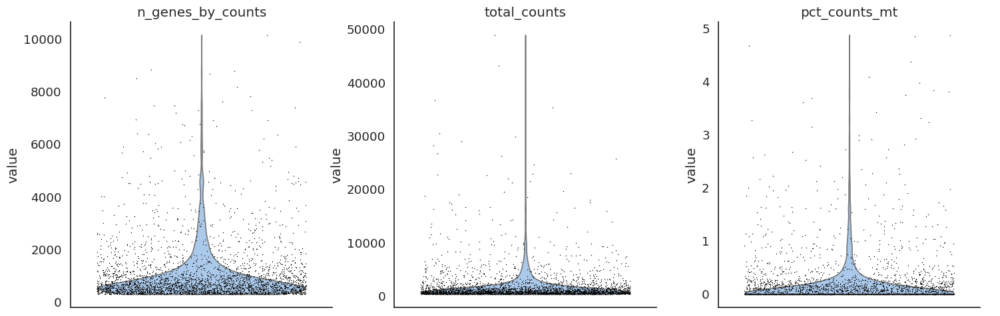

In [102]:
save_path = 'QC_RNA_after_filtration.pdf'
sc.pl.violin(rna_perimarginal, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True, save=save_path)


In [103]:
rna_perimarginal = rna_perimarginal[:, ~rna_perimarginal.var['mt'].values] #remove mt genes

In [104]:
sc.pp.normalize_total(rna_perimarginal, target_sum=1e4)

In [105]:
sc.pp.log1p(rna_perimarginal)

In [106]:
sc.pp.highly_variable_genes(rna_perimarginal, min_mean=0.02, max_mean=4, min_disp=0.5)

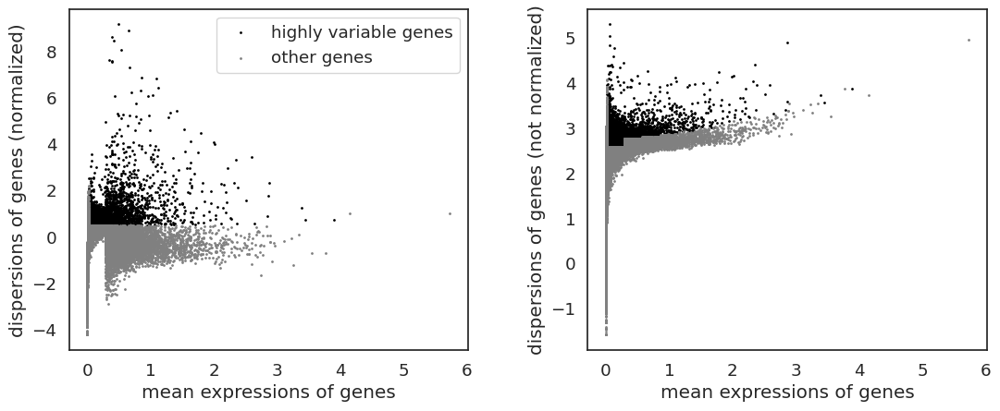

In [107]:
save_path = '.pdf'

sc.pl.highly_variable_genes(rna_perimarginal, save=save_path)


In [108]:
rna_perimarginal.raw = rna_perimarginal 
sc.pp.scale(rna_perimarginal, max_value=10)

In [109]:
rna_perimarginal

AnnData object with n_obs × n_vars = 3156 × 36588
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg'

In [110]:
BASE_DIR

'/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT02/Perimarginal'

In [238]:
rna_perimarginal.write(f'{BASE_DIR}/BTROHT02_4_peri_rna_QcFiltered.h5ad')

AttributeError: 'str' object has no attribute 'write'

## Read QC Filtered Data

In [239]:
rna_perimarginal = sc.read(f'{BASE_DIR}/BTROHT02_4_peri_rna_QcFiltered.h5ad')

In [240]:
rna_perimarginal

AnnData object with n_obs × n_vars = 3156 × 36588
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'log1p'

In [234]:
#rna_perimarginal = ('/home/fatemeh.nasrabadi/untilforcongasclean/BTROHT2/peri/BTROHT02_rna_peri__23ThOctober3_muon_new.h5ad')

## PCA and UMAP 

In [241]:
sc.tl.pca(rna_perimarginal, svd_solver='arpack', use_highly_variable=False)

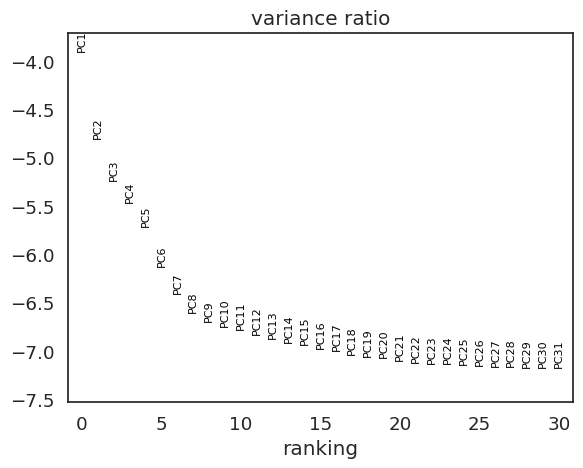

In [242]:
save_path = '.pdf'
sc.pl.pca_variance_ratio(rna_perimarginal, log=True, save=save_path)

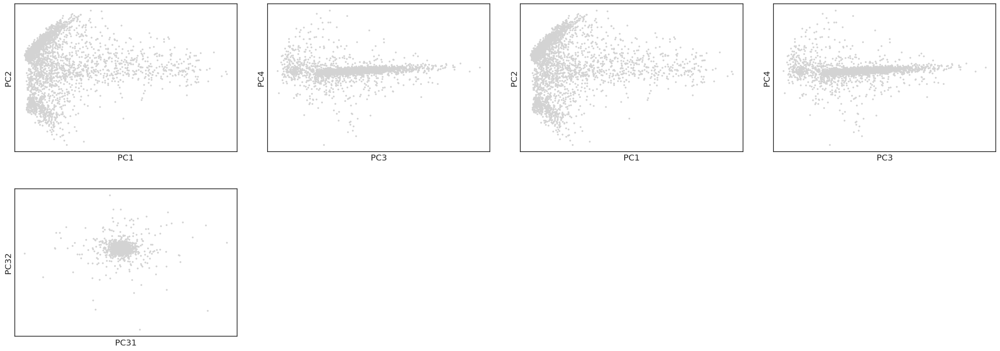

In [243]:
sc.pl.pca(
    rna_perimarginal,
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3),(30,31)]
)

In [244]:
sc.pp.neighbors(rna_perimarginal, n_neighbors=20, n_pcs=25, )

In [245]:
sc.tl.leiden(rna_perimarginal, resolution=1.5, random_state=11)

In [246]:
sc.tl.umap(rna_perimarginal, random_state=11)

In [247]:
rna_perimarginal

AnnData object with n_obs × n_vars = 3156 × 36588
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'leiden', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

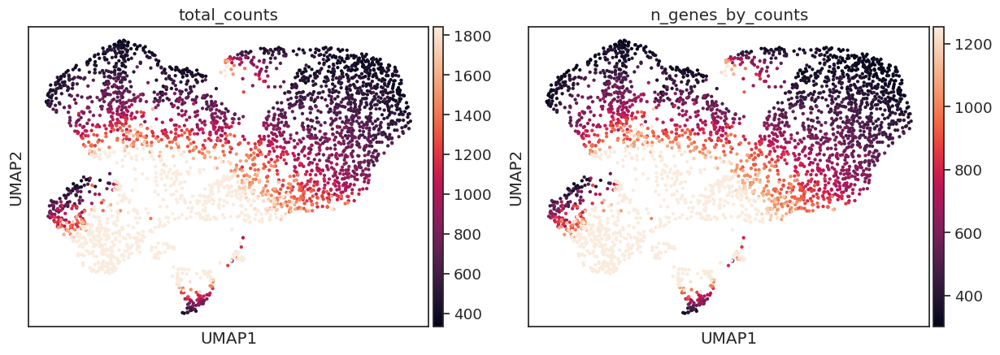

In [248]:
save_path = '_RNA_QC_metrics.pdf'
sc.pl.umap(rna_perimarginal, color=['total_counts', 'n_genes_by_counts'], save=save_path, vmax='p80')

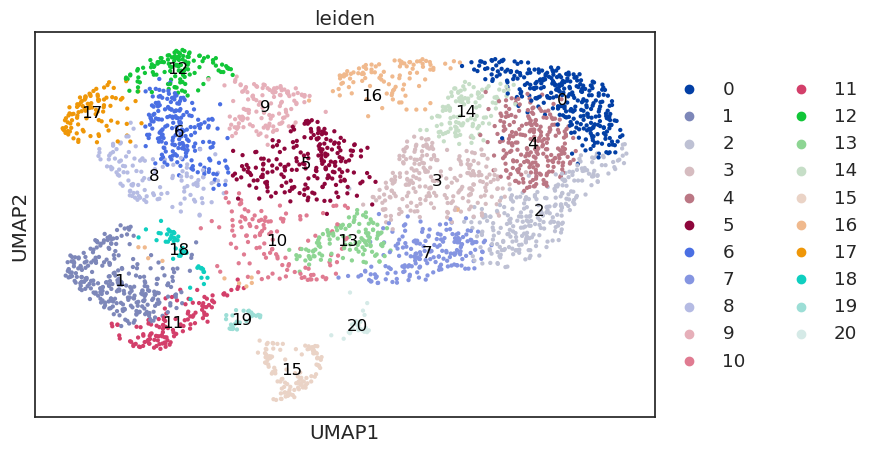

In [249]:
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc

# Assume 'rna_perimarginal' is your AnnData object

# Create a figure with one plot
fig, ax = plt.subplots(1, 1, figsize=(8, 5))  # Adjust the figsize as needed

# Group to plot
group = 'leiden'

# Plot the UMAP for the specified group
sc.pl.umap(rna_perimarginal, color=group, show=False, ax=ax)

# Add cluster numbers as annotations
for cluster in rna_perimarginal.obs[group].unique():
    # Get the UMAP coordinates for the current cluster
    cluster_data = rna_perimarginal[rna_perimarginal.obs[group] == cluster]
    
    # Calculate the mean UMAP coordinates for the cluster
    mean_x = cluster_data.obsm['X_umap'][:, 0].mean()
    mean_y = cluster_data.obsm['X_umap'][:, 1].mean()
    
    # Add the cluster label at the mean coordinates
    ax.text(mean_x, mean_y, str(cluster), fontsize=12, ha='center', va='center', color='black')

# Adjust layout and spacing
plt.subplots_adjust(wspace=0.7, hspace=0.3)

# Display the plot
plt.show()

# Save the figure
save_path_png = 'figures/UMAP_BTROHT02-perimarginal_leiden_clustering_plots.jpg'
save_path_pdf = 'figures/UMAP_BTROHT02-perimarginal_leiden_clustering_plots.pdf'
fig.savefig(save_path_png, bbox_inches='tight')  # Save as PNG with tight bounding box
fig.savefig(save_path_pdf, bbox_inches='tight')  # Save as PDF with tight bounding box

# Close the figure to free up memory
plt.close(fig)


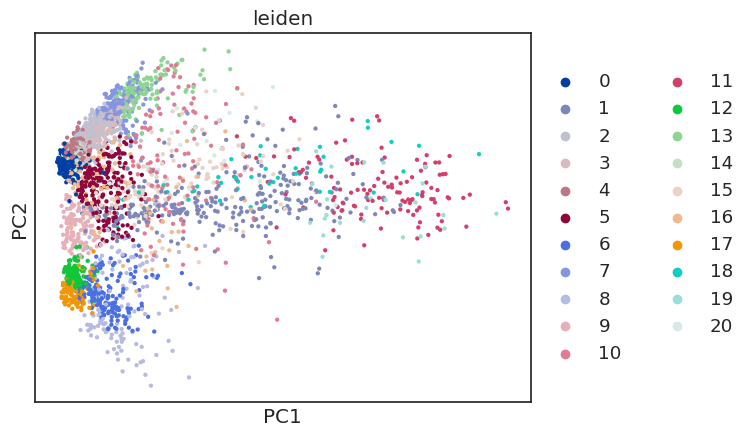

In [250]:
sc.pl.pca(
    rna_perimarginal,
    dimensions=[(0, 1)], color='leiden'
)

## Celltypist for perimarginal

In [251]:
import celltypist
from celltypist import models
models.models_path= '/home/fatemeh.nasrabadi/ROVIGO/models_cell_typist/'

In [252]:
model = models.Model.load(model = 'Adult_Human_PrefrontalCortex.pkl')
predictions_adult = celltypist.annotate(rna_perimarginal, model = 'Adult_Human_PrefrontalCortex.pkl', majority_voting = True)

👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 3156 cells and 36588 genes
🔗 Matching reference genes in the model
🧬 3652 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!


In [253]:
#scaling for the core yes
#for the perimarginal no

In [254]:
rna_perimarginal.obs['cell_typist_majority_voting_Adult_Human_PrefrontalCortex']=predictions_adult.predicted_labels['majority_voting']
rna_perimarginal.obs['cell_typist_predicted_labels_Adult_Human_PrefrontalCortex']=predictions_adult.predicted_labels['predicted_labels']
rna_perimarginal.obs["celltypist_conf_score_Adult_Human_PrefrontalCortex"] = predictions_adult.to_adata().obs.loc[
    rna_perimarginal.obs.index, "conf_score"
]

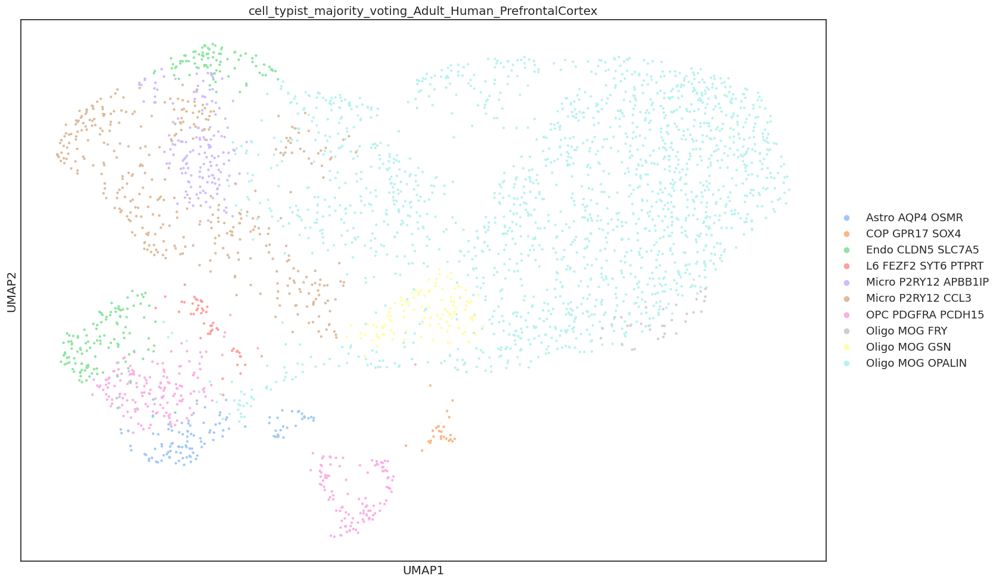

In [255]:
# Assume 'rna_combined' is your AnnData object

# Create a figure with one plot
fig, ax = plt.subplots(1, 1, figsize=(17, 10))  # Increase the size

# Group to plot
group = 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex'

# Plot the UMAP for the specified group
sc.pl.umap(rna_perimarginal, color=group, show=False, ax=ax)

# Adjust layout and spacing
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.7, hspace=0.3)
plt.tight_layout()  # Automatically adjust subplot parameters

# Display the plot
plt.show()

# Save the figure
save_path_png = 'figures/UMAP_BTROHT02-perimarginal_annotated1_plots.png'
save_path_pdf = 'figures/UMAP_BTROHT02-perimarginal_annotated1_plots.pdf'
fig.savefig(save_path_png, bbox_inches='tight', pad_inches=0.1)  # Save as PNG with tight bounding box
fig.savefig(save_path_pdf, bbox_inches='tight', pad_inches=0.1)  # Save as PDF with tight bounding box

# Close the figure to free up memory
plt.close(fig)


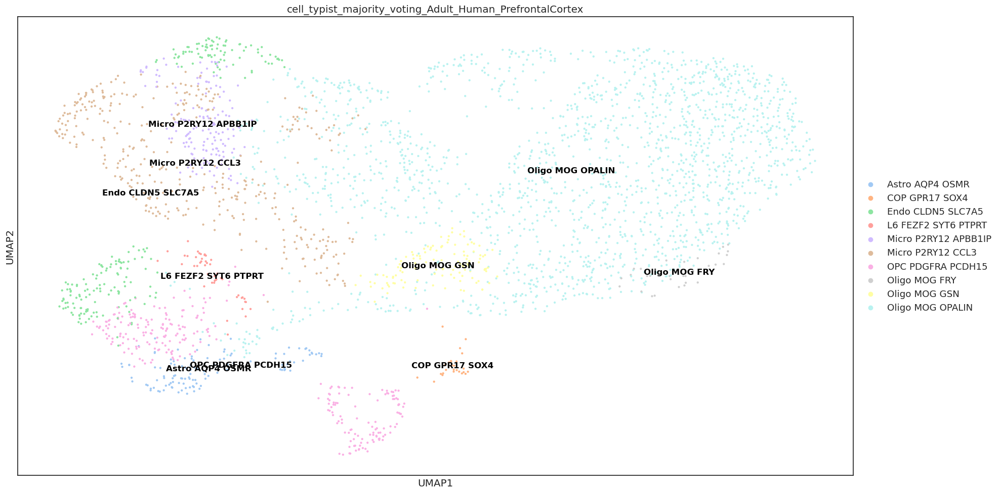

In [257]:
# Assume 'rna_perimarginal' is your AnnData object

# Create a figure with one plot
fig, ax = plt.subplots(1, 1, figsize=(20, 10))  # Increase the size

# Group to plot
group = 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex'

# Plot the UMAP for the specified group
sc.pl.umap(rna_perimarginal, color=group, show=False, ax=ax)

# Add cluster names at the center of each cluster
for cluster in rna_perimarginal.obs[group].unique():
    # Get the UMAP coordinates for the current cluster
    cluster_data = rna_perimarginal[rna_perimarginal.obs[group] == cluster]
    
    # Calculate the mean UMAP coordinates for the cluster
    mean_x = cluster_data.obsm['X_umap'][:, 0].mean()
    mean_y = cluster_data.obsm['X_umap'][:, 1].mean()
    
    # Add the cluster label at the mean coordinates
    ax.text(mean_x, mean_y, str(cluster), fontsize=12, ha='center', va='center', color='black', fontweight='bold')

# Adjust layout and spacing
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.7, hspace=0.3)
plt.tight_layout()  # Automatically adjust subplot parameters

# Display the plot
plt.show()

# Save the figure
save_path_png = 'figures/UMAP_BTROHT02-perimarginal_annotate2_plots.png'
save_path_pdf = 'figures/UMAP_BTROHT02-perimarginal_annotate2_plots.pdf'
fig.savefig(save_path_png, bbox_inches='tight', pad_inches=0.1)  # Save as PNG with tight bounding box
fig.savefig(save_path_pdf, bbox_inches='tight', pad_inches=0.1)  # Save as PDF with tight bounding box

# Close the figure to free up memory
plt.close(fig)


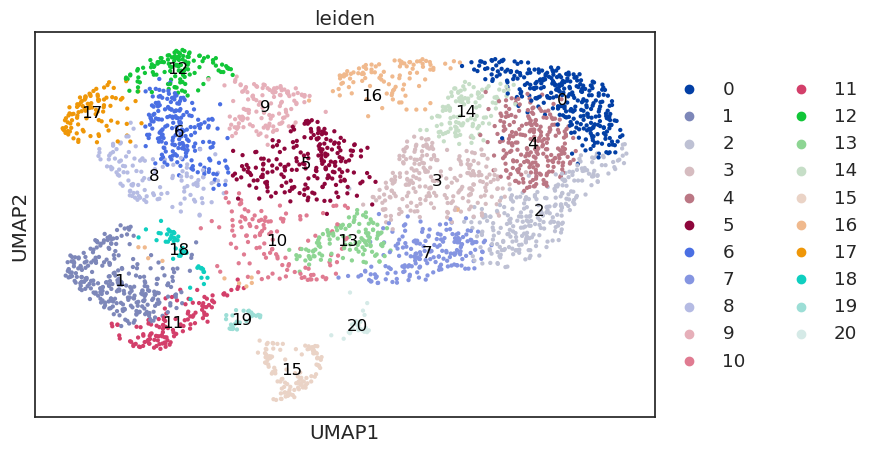

In [258]:
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc

# Assume 'rna_perimarginal' is your AnnData object

# Create a figure with one plot
fig, ax = plt.subplots(1, 1, figsize=(8, 5))  # Adjust the figsize as needed

# Group to plot
group = 'leiden'

# Plot the UMAP for the specified group
sc.pl.umap(rna_perimarginal, color=group, show=False, ax=ax)

# Add cluster numbers as annotations
for cluster in rna_perimarginal.obs[group].unique():
    # Get the UMAP coordinates for the current cluster
    cluster_data = rna_perimarginal[rna_perimarginal.obs[group] == cluster]
    
    # Calculate the mean UMAP coordinates for the cluster
    mean_x = cluster_data.obsm['X_umap'][:, 0].mean()
    mean_y = cluster_data.obsm['X_umap'][:, 1].mean()
    
    # Add the cluster label at the mean coordinates
    ax.text(mean_x, mean_y, str(cluster), fontsize=12, ha='center', va='center', color='black')

# Adjust layout and spacing
plt.subplots_adjust(wspace=0.7, hspace=0.3)

# Display the plot
plt.show()

# Save the figure
save_path_png = 'figures/UMAP_BTROHT02-perimarginal_leiden_clustering_plots.jpg'
save_path_pdf = 'figures/UMAP_BTROHT02-perimarginal_leiden_clustering_plots.pdf'
fig.savefig(save_path_png, bbox_inches='tight')  # Save as PNG with tight bounding box
fig.savefig(save_path_pdf, bbox_inches='tight')  # Save as PDF with tight bounding box

# Close the figure to free up memory
plt.close(fig)


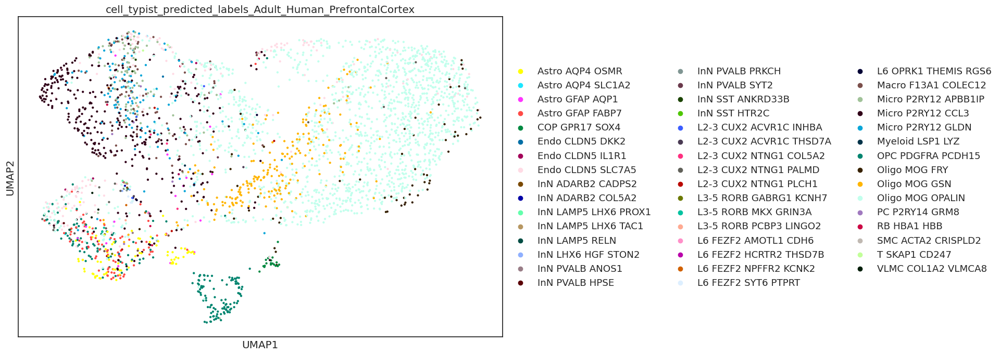

In [259]:


# Assume 'rna_combined' is your AnnData object

# Create a figure with one plot
fig, ax = plt.subplots(1, 1, figsize=(12, 8))  # Adjust the figsize as needed

# Group to plot
group = 'cell_typist_predicted_labels_Adult_Human_PrefrontalCortex'

# Plot the UMAP for the specified group
sc.pl.umap(rna_perimarginal, color=group, show=False, ax=ax)

# Adjust layout and spacing (not really necessary for a single plot, but keeping it in case you expand)
plt.subplots_adjust(wspace=0.7, hspace=0.3)

# Display the plot
plt.show()

# Save the figure
save_path = 'figures/UMAP_BTROHT02-perimarginal_annotated_plots.png'
fig.savefig(save_path)

# Close the figure to free up memory
plt.close(fig)


In [260]:
# sc.tl.dendrogram(rna, groupby='celltype',)
sc.tl.rank_genes_groups(rna_perimarginal, groupby='cell_typist_majority_voting_Adult_Human_PrefrontalCortex', method='wilcoxon')

result = rna_perimarginal.uns['rank_genes_groups']
gene_names = []
gene_dict = {}

for type in rna_perimarginal.obs['cell_typist_majority_voting_Adult_Human_PrefrontalCortex'].unique():
    if type in result['names'].dtype.names:
        top_genes = result['names'][type][:5]
        gene_names.extend(top_genes)
        gene_dict[type] = top_genes

gene_dict


{'Oligo MOG OPALIN': array(['CERCAM', 'IL1RAPL1', 'PLP1', 'MBP', 'CTNNA3'], dtype=object),
 'Micro P2RY12 APBB1IP': array(['SLC11A1', 'PLXDC2', 'ARHGAP24', 'LRMDA', 'DOCK4'], dtype=object),
 'Micro P2RY12 CCL3': array(['PLXDC2', 'SAT1', 'SLC11A1', 'ARHGAP24', 'ZFP36'], dtype=object),
 'Oligo MOG FRY': array(['IL1RAPL1', 'FUT8', 'ERBB4', 'NKAIN2', 'SIK3'], dtype=object),
 'Endo CLDN5 SLC7A5': array(['PTPRZ1', 'MALAT1', 'HNRNPA2B1', 'LRP1', 'ATP1A2'], dtype=object),
 'OPC PDGFRA PCDH15': array(['PTPRZ1', 'NRCAM', 'LRP1B', 'LSAMP', 'SNTG1'], dtype=object),
 'Oligo MOG GSN': array(['RBFOX1', 'CNTNAP4', 'DLC1', 'PCSK6', 'RASGRF1'], dtype=object),
 'Astro AQP4 OSMR': array(['ADGRV1', 'DTNA', 'NRCAM', 'DCLK2', 'AC012405.1'], dtype=object),
 'COP GPR17 SOX4': array(['TMEM132B', 'FYN', 'TMEM108', 'LSAMP', 'FRMD4A'], dtype=object),
 'L6 FEZF2 SYT6 PTPRT': array(['SNHG14', 'MEG3', 'NRG3', 'RBFOX1', 'SYT1'], dtype=object)}

In [261]:
#Checked genes

#DLGAP1: Neurons 

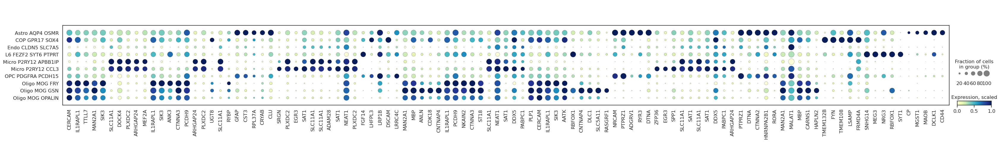

In [263]:
import seaborn as sns
import scanpy as sc

sns.set_theme(style="white", palette="pastel", font_scale=1.2, rc={"lines.linewidth": 0.5})
save_path = '_rna_marker_genes.pdf'

sc.pl.dotplot(rna_perimarginal, var_names=gene_names, 
              groupby='cell_typist_majority_voting_Adult_Human_PrefrontalCortex', colorbar_title='Expression, scaled',
              # categories_order=[ 'Brain neurons', 'mOli', 'Microglia' , 'Astrocytes', 'Tumor cells' ], 
              standard_scale='var', 
              cmap='YlGnBu',  
              dendrogram=False, save=save_path)


In [262]:
# sc.tl.dendrogram(rna, groupby='celltype',)
sc.tl.rank_genes_groups(rna_perimarginal, groupby='leiden', method='wilcoxon')

result = rna_perimarginal.uns['rank_genes_groups']
gene_names = []
gene_dict = {}

for type in rna_perimarginal.obs['leiden'].unique():
    if type in result['names'].dtype.names:
        top_genes = result['names'][type][:5]
        gene_names.extend(top_genes)
        gene_dict[type] = top_genes

gene_dict


/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecell_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:429: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecell_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:431: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecel

{'4': array(['CERCAM', 'IL1RAPL1', 'TTLL7', 'MAN2A1', 'SIK3'], dtype=object),
 '6': array(['SLC11A1', 'DOCK4', 'PLXDC2', 'ARHGAP24', 'MEF2A'], dtype=object),
 '2': array(['IL1RAPL1', 'SIK3', 'ANK3', 'CTNNA3', 'PCDH9'], dtype=object),
 '10': array(['ARHGAP24', 'PLXDC2', 'UGT8', 'SLC11A1', 'RYBP'], dtype=object),
 '16': array(['GFAP', 'CST3', 'RPL37A', 'CRYAB', 'CLU'], dtype=object),
 '8': array(['SRGN', 'PLXDC2', 'EGR3', 'SAT1', 'SLC11A1'], dtype=object),
 '12': array(['SLC11A1', 'ADAM28', 'SAT1', 'NEAT1', 'PLXDC2'], dtype=object),
 '15': array(['FGF14', 'LHFPL3', 'LRP1B', 'DSCAM', 'LRRC4C'], dtype=object),
 '3': array(['MAN2A1', 'MBP', 'ANLN', 'CDK18', 'CNTNAP4'], dtype=object),
 '7': array(['IL1RAPL1', 'PCDH9', 'NKAIN2', 'CTNNA3', 'ST18'], dtype=object),
 '9': array(['SLC11A1', 'NEAT1', 'SAT1', 'DDX5', 'PABPC1'], dtype=object),
 '0': array(['PLP1', 'CERCAM', 'IL1RAPL1', 'SIK3', 'AATK'], dtype=object),
 '13': array(['RBFOX1', 'CNTNAP4', 'DLC1', 'SLC5A11', 'RASGRF1'], dtype=object),
 '1

## InferCNV

In [264]:
import infercnvpy as cnv
adata_add = cnv.datasets.maynard2020_3k()
adata_add.var.loc[:, ["ensg", "chromosome", "start", "end"]]
adata_add

AnnData object with n_obs × n_vars = 3000 × 55556
    obs: 'age', 'sex', 'sample', 'patient', 'cell_type'
    var: 'ensg', 'mito', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_counts', 'chromosome', 'start', 'end', 'gene_id', 'gene_name'
    uns: 'cell_type_colors', 'neighbors', 'umap'
    obsm: 'X_scVI', 'X_umap'
    obsp: 'connectivities', 'distances'

In [265]:
adata_add.obs

,age,sex,sample,patient,cell_type
Run,,,,,
SRR10796381,53,female,LT_S74,TH248,T cell CD4
SRR10787713,40,female,LT_S75,TH266,Macrophage
SRR10785570,56,male,LT_S28,TH185,T cell CD4
SRR10790048,69,female,LT_S65,TH238_NAT,Monocyte
SRR10782528,46,female,LT_S08,TH103,Epithelial cell
...,...,...,...,...,...
SRR10782593,71,female,LT_S47,TH220,Fibroblast
SRR10789971,55,male,LT_S21,TH185,Epithelial cell
SRR10780468,62,male,LT_S58,TH179,Epithelial cell


In [266]:
adata_add.var

,ensg,mito,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_counts,chromosome,start,end,gene_id,gene_name
symbol,,,,,,,,,,,,
AL645933.5,ENSG00000288587.1,False,1854,1.613897,91.340091,34551.914062,34551.914062,chr6,31400702,31463705,ENSG00000288587.1,AL645933.5
AC010184.1,ENSG00000288585.1,False,310,0.412183,98.552011,8824.419922,8824.419922,chr3,141449745,141456434,ENSG00000288585.1,AC010184.1
AC023296.1,ENSG00000288580.1,False,103,0.196091,99.518894,4198.104004,4198.104004,chr8,2923568,2926689,ENSG00000288580.1,AC023296.1
AL117334.2,ENSG00000288577.1,False,176,0.087959,99.177916,1883.123047,1883.123047,chr20,3406380,3410036,ENSG00000288577.1,AL117334.2
AC107294.4,ENSG00000288576.1,False,9,0.023121,99.957962,495.000000,495.000000,chr3,184778723,184780720,ENSG00000288576.1,AC107294.4
...,...,...,...,...,...,...,...,...,...,...,...,...
DOCK8-AS1,ENSG00000183784.7,False,1758,9.321348,91.788500,199560.750000,199560.750000,chr9,212824,215893,ENSG00000183784.7,DOCK8-AS1
LIF-AS1,ENSG00000232530.1,False,265,0.545650,98.762203,11681.813477,11681.813477,chr22,30239194,30240538,ENSG00000232530.1,LIF-AS1
AC093673.1,ENSG00000232533.1,False,3423,15.522471,84.011397,332320.593750,332320.593750,chr7,143379692,143380495,ENSG00000232533.1,AC093673.1


In [267]:
adata_inf=rna_perimarginal.raw.to_adata()
adata_inf.var['end']=adata_add.var.loc[:, ["end"]]
adata_inf.var['start']=adata_add.var.loc[:, ["start"]]
adata_inf.var['chromosome']=adata_add.var.loc[:, ["chromosome"]]
adata_inf.var.loc[:, [ "chromosome", "start", "end"]]

,chromosome,start,end
MIR1302-2HG,chr1,29554.0,31109.0
FAM138A,chr1,34554.0,36081.0
OR4F5,chr1,65419.0,71585.0
AL627309.1,chr1,89295.0,133723.0
AL627309.3,chr1,89551.0,91105.0
...,...,...,...
AC141272.1,KI270728.1,1270984.0,1271271.0
AC023491.2,KI270731.1,10598.0,13001.0
AC007325.1,KI270734.1,72411.0,74814.0
AC007325.4,KI270734.1,131494.0,137392.0


In [268]:
rna_perimarginal.obs['cell_typist_majority_voting_Adult_Human_PrefrontalCortex'].value_counts()

cell_typist_majority_voting_Adult_Human_PrefrontalCortex
Oligo MOG OPALIN        1813
Micro P2RY12 CCL3        370
OPC PDGFRA PCDH15        270
Endo CLDN5 SLC7A5        209
Micro P2RY12 APBB1IP     153
Astro AQP4 OSMR          118
Oligo MOG GSN            118
L6 FEZF2 SYT6 PTPRT       47
Oligo MOG FRY             32
COP GPR17 SOX4            26
Name: count, dtype: int64

In [269]:
cnv.tl.infercnv(
    adata_inf,
    reference_key="cell_typist_majority_voting_Adult_Human_PrefrontalCortex",
    window_size=250,
    reference_cat=[
       'Micro P2RY12 CCL3',
        'Endo CLDN5 SLC7A5',
        'Micro P2RY12 APBB1IP',
        'L6 FEZF2 SYT6 PTPRT'
    ]
)


  0%|          | 0/1 [00:00<?, ?it/s]

In [174]:
#######CHECH THE PARAMETERS#########  

In [270]:
cnv.tl.pca(adata_inf)
cnv.pp.neighbors(adata_inf, )
cnv.tl.leiden(adata_inf,)



for core 

    
cnv.tl.pca(adata_inf)
cnv.pp.neighbors(adata_inf, )
cnv.tl.leiden(adata_inf,resolution=2)
#cnv.tl.leiden(adata_inf,) #0
#resolution=2

for core 

sc.pp.neighbors(rna_core, n_neighbors=20, n_pcs=25, )
sc.tl.umap(rna_core, random_state=11) #default for min_dist=0.5

to : 
    
sc.pp.neighbors(rna_core, n_neighbors=10, n_pcs=25, )
sc.tl.umap(rna_core, random_state=11,min_dist=0.15)


In [271]:
cnv.tl.umap(adata_inf) #for core min_dist= 0.15
cnv.tl.cnv_score(adata_inf)

In [272]:
#два способа расчета cnv score для отдельной клетки
rna_perimarginal.obs['cnv_raw_l1'] = pd.DataFrame(np.ravel(np.mean(np.abs(adata_inf.obsm[f"X_cnv"]), axis=1)), 
                                     index=rna_perimarginal.obs.index)
rna_perimarginal.obs['cnv_raw_l2'] = pd.DataFrame(np.ravel(np.mean((adata_inf.obsm[f"X_cnv"]).power(2), axis=1))**.5, 
                                     index=rna_perimarginal.obs.index)
rna_perimarginal.obs['cnv_score']=adata_inf.obs['cnv_score']
rna_perimarginal.obs['cnv_leiden']=adata_inf.obs['cnv_leiden']

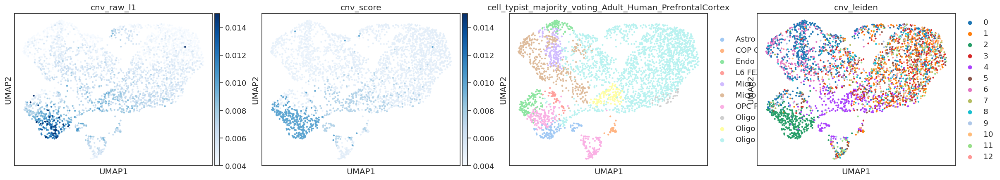

In [273]:
save_path='_rna_cnv.pdf'

sc.pl.umap(rna_perimarginal, ncols=4, color=['cnv_raw_l1', 'cnv_score', 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex', 'cnv_leiden'], 
            color_map='Blues', vmax=0.015, vmin=0.004, save=save_path)

... storing 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex' as categorical


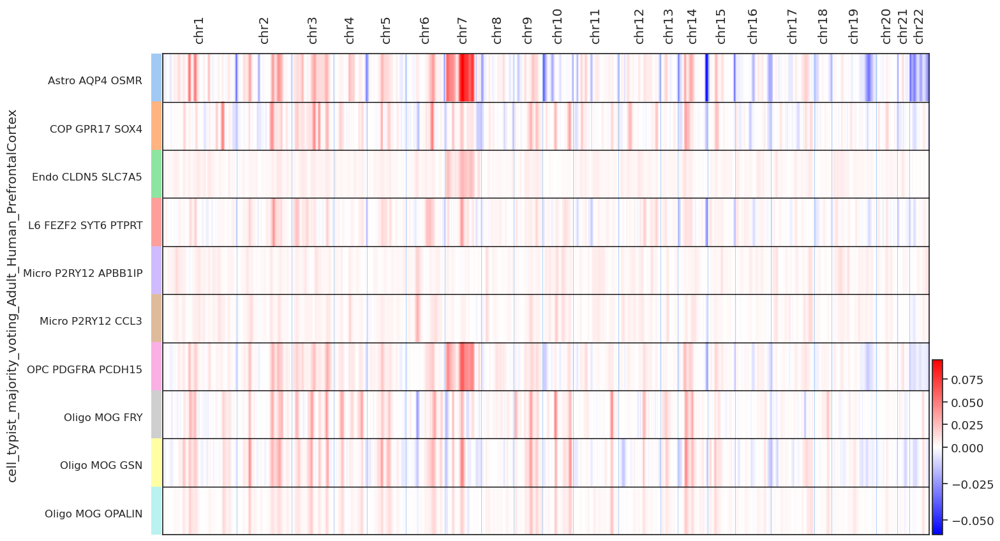

In [274]:
save_path='_rna_cnv_heatmap_celltypist.pdf'
cnv.pl.chromosome_heatmap_summary(adata_inf, groupby="cell_typist_majority_voting_Adult_Human_PrefrontalCortex", save=save_path)

... storing 'leiden' as categorical


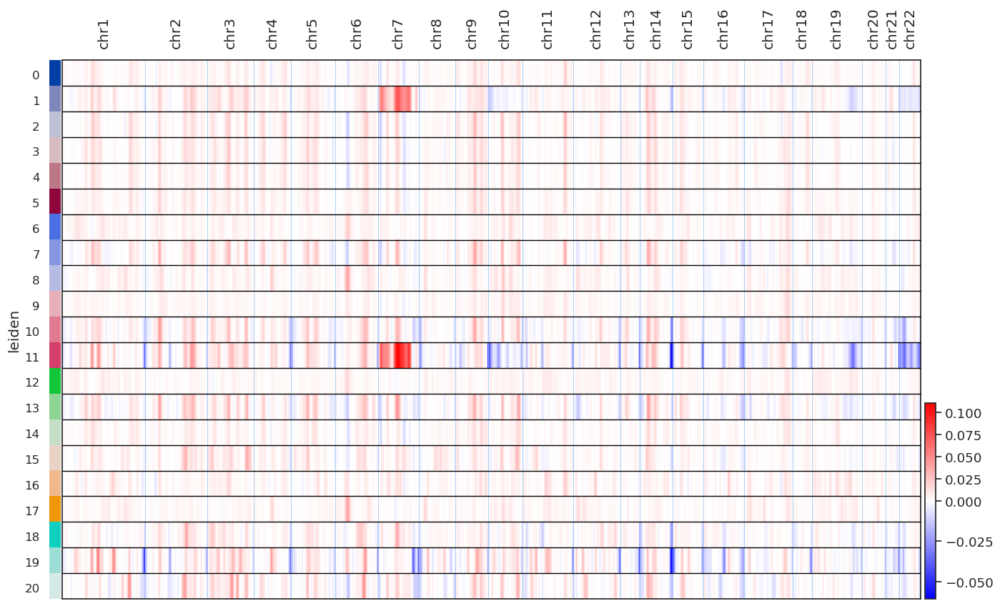

In [275]:
save_path='_rna_cnv_heatmap_lieden.pdf'
cnv.pl.chromosome_heatmap_summary(adata_inf, groupby="leiden", save= save_path)

... storing 'cnv_leiden' as categorical


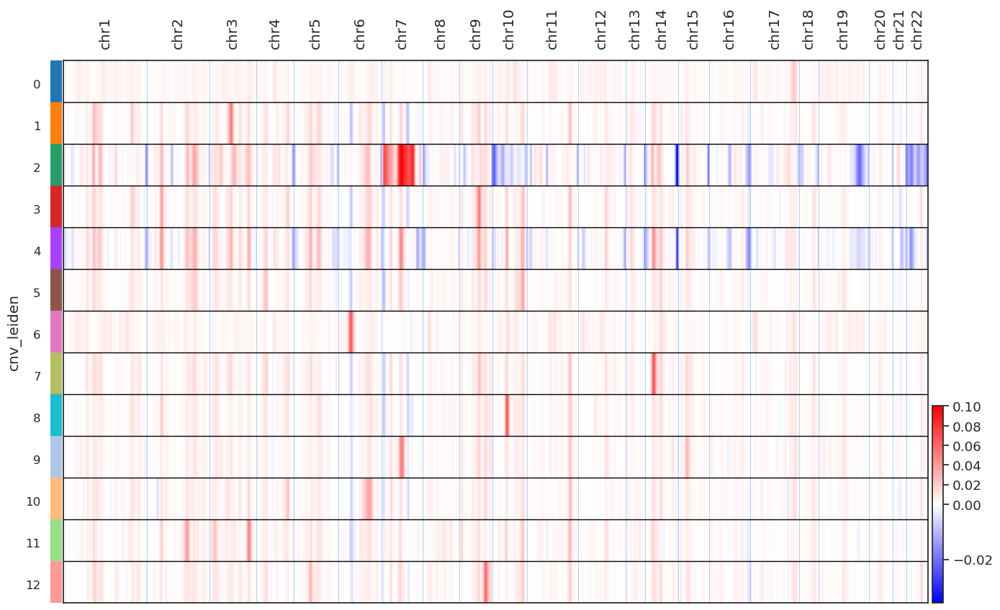

In [276]:
save_path='_rna_cnv_heatmap_cnv_leiden.pdf'
cnv.pl.chromosome_heatmap_summary(adata_inf, groupby="cnv_leiden")

         Falling back to preprocessing with `sc.pp.pca` and default params.
categories: Astro AQP4 OSMR, COP GPR17 SOX4, Endo CLDN5 SLC7A5, etc.
var_group_labels: chr1, chr2, chr3, etc.


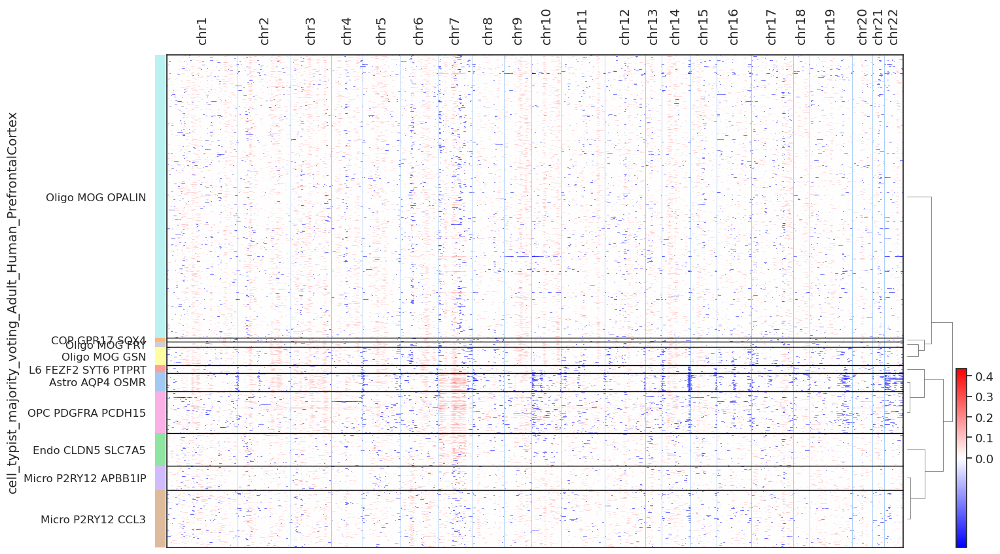

In [277]:
cnv.pl.chromosome_heatmap(adata_inf, groupby='cell_typist_majority_voting_Adult_Human_PrefrontalCortex', dendrogram=True)

         Falling back to preprocessing with `sc.pp.pca` and default params.
categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


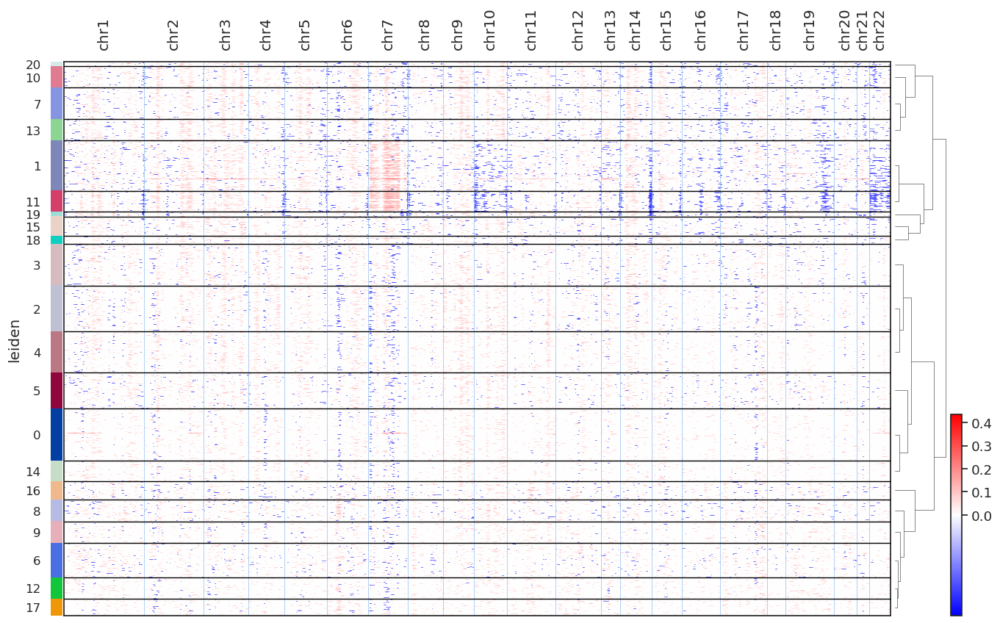

In [278]:
cnv.pl.chromosome_heatmap(adata_inf, groupby="leiden", dendrogram=True)

categories: Astro AQP4 OSMR, COP GPR17 SOX4, Endo CLDN5 SLC7A5, etc.
var_group_labels: chr1, chr2, chr3, etc.


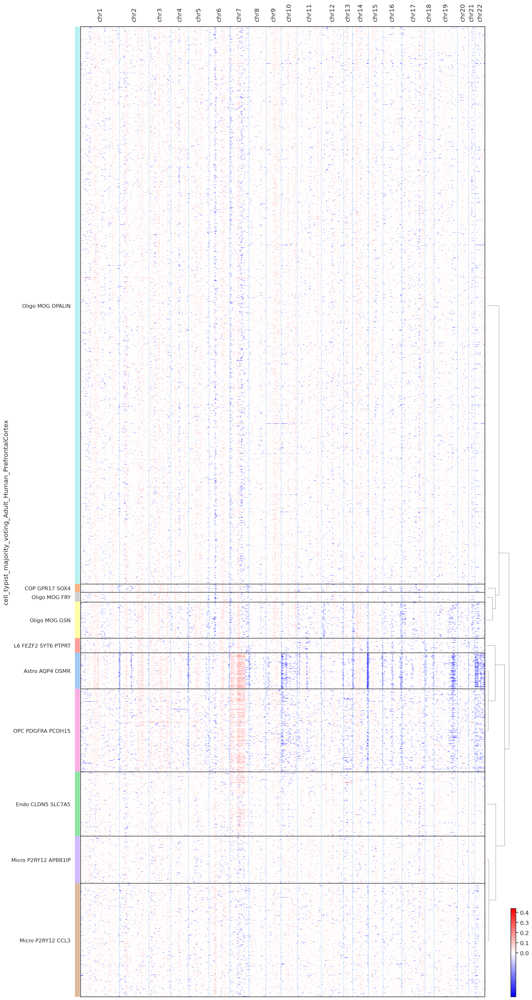

In [279]:
cnv.pl.chromosome_heatmap(adata_inf, groupby='cell_typist_majority_voting_Adult_Human_PrefrontalCortex', dendrogram=True, figsize = (18,40))

         Falling back to preprocessing with `sc.pp.pca` and default params.
categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


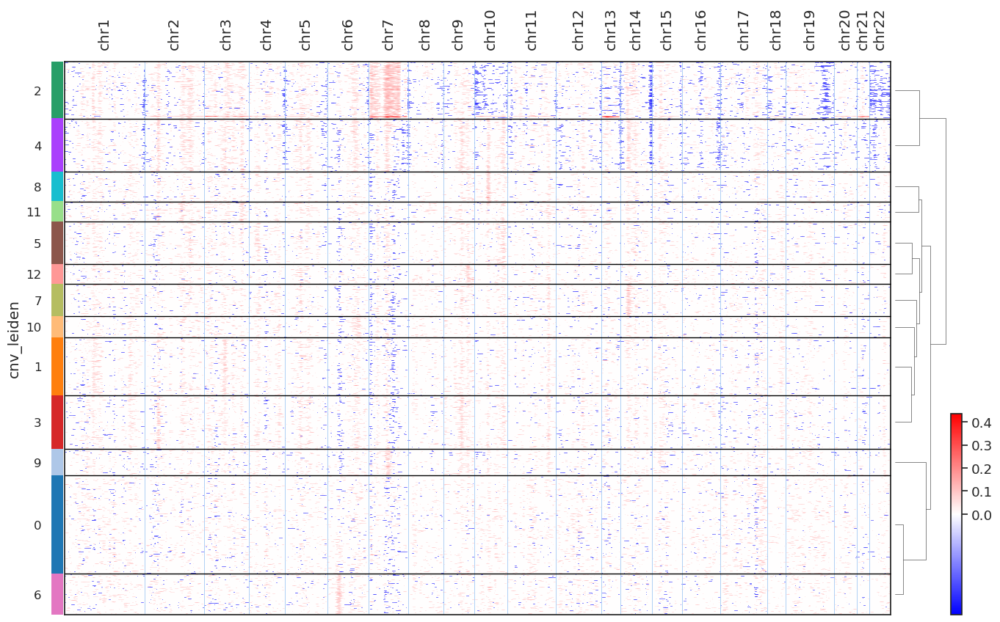

In [280]:
cnv.pl.chromosome_heatmap(adata_inf, groupby="cnv_leiden", dendrogram=True)

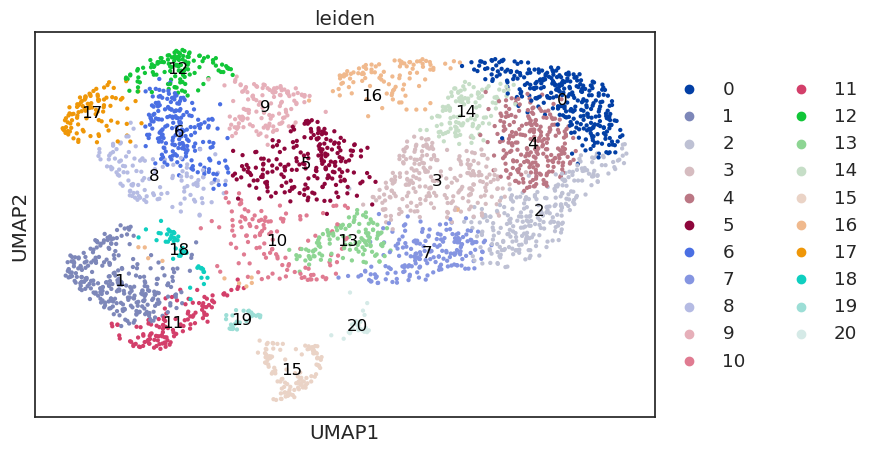

In [281]:
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc

# Assume 'rna_perimarginal' is your AnnData object

# Create a figure with one plot
fig, ax = plt.subplots(1, 1, figsize=(8, 5))  # Adjust the figsize as needed

# Group to plot
group = 'leiden'

# Plot the UMAP for the specified group
sc.pl.umap(rna_perimarginal, color=group, show=False, ax=ax)

# Add cluster numbers as annotations
for cluster in rna_perimarginal.obs[group].unique():
    # Get the UMAP coordinates for the current cluster
    cluster_data = rna_perimarginal[rna_perimarginal.obs[group] == cluster]
    
    # Calculate the mean UMAP coordinates for the cluster
    mean_x = cluster_data.obsm['X_umap'][:, 0].mean()
    mean_y = cluster_data.obsm['X_umap'][:, 1].mean()
    
    # Add the cluster label at the mean coordinates
    ax.text(mean_x, mean_y, str(cluster), fontsize=12, ha='center', va='center', color='black')

# Adjust layout and spacing
plt.subplots_adjust(wspace=0.7, hspace=0.3)

# Display the plot
plt.show()

# Save the figure
save_path_png = 'figures/UMAP_BTROHT02-perimarginal_leiden_clustering_plots.jpg'
save_path_pdf = 'figures/UMAP_BTROHT02-perimarginal_leiden_clustering_plots.pdf'
fig.savefig(save_path_png, bbox_inches='tight')  # Save as PNG with tight bounding box
fig.savefig(save_path_pdf, bbox_inches='tight')  # Save as PDF with tight bounding box

# Close the figure to free up memory
plt.close(fig)


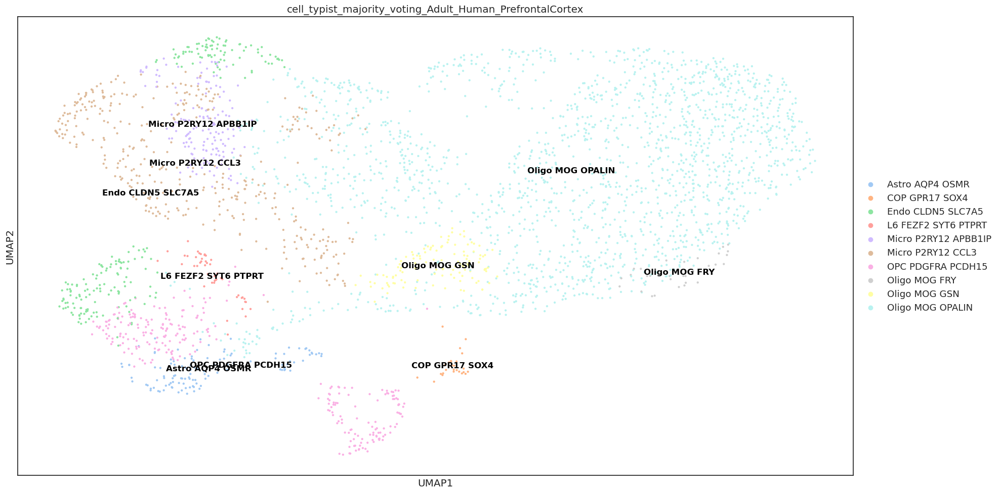

In [282]:
# Assume 'rna_perimarginal' is your AnnData object

# Create a figure with one plot
fig, ax = plt.subplots(1, 1, figsize=(20, 10))  # Increase the size

# Group to plot
group = 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex'

# Plot the UMAP for the specified group
sc.pl.umap(rna_perimarginal, color=group, show=False, ax=ax)

# Add cluster names at the center of each cluster
for cluster in rna_perimarginal.obs[group].unique():
    # Get the UMAP coordinates for the current cluster
    cluster_data = rna_perimarginal[rna_perimarginal.obs[group] == cluster]
    
    # Calculate the mean UMAP coordinates for the cluster
    mean_x = cluster_data.obsm['X_umap'][:, 0].mean()
    mean_y = cluster_data.obsm['X_umap'][:, 1].mean()
    
    # Add the cluster label at the mean coordinates
    ax.text(mean_x, mean_y, str(cluster), fontsize=12, ha='center', va='center', color='black', fontweight='bold')

# Adjust layout and spacing
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.7, hspace=0.3)
plt.tight_layout()  # Automatically adjust subplot parameters

# Display the plot
plt.show()

# Save the figure
save_path_png = 'figures/UMAP_BTROHT02-perimarginal_annotate2_plots.png'
save_path_pdf = 'figures/UMAP_BTROHT02-perimarginal_annotate2_plots.pdf'
fig.savefig(save_path_png, bbox_inches='tight', pad_inches=0.1)  # Save as PNG with tight bounding box
fig.savefig(save_path_pdf, bbox_inches='tight', pad_inches=0.1)  # Save as PDF with tight bounding box

# Close the figure to free up memory
plt.close(fig)


In [286]:
# Define a new mapping for cell types based on Leiden clusters with the updated assignments
cluster_to_celltype = {
    "1": "Tumor Cells", "11": "Tumor Cells", "19": "Tumor Cells", "15": "Tumor Cells", "20": "Tumor Cells",
    "18": "Neurons",
    "17": "Immune Cells", "8": "Immune Cells", "6": "Immune Cells", "12": "Immune Cells",
    "9": "Oligodendrocytes", "5": "Oligodendrocytes", "10": "Oligodendrocytes", 
    "13": "Oligodendrocytes", "7": "Oligodendrocytes", "2": "Oligodendrocytes", 
    "3": "Oligodendrocytes", "4": "Oligodendrocytes", "14": "Oligodendrocytes", 
    "16": "Oligodendrocytes","0": "Oligodendrocytes"
}

# Map the Leiden clusters to cell types with the updated labels
rna_perimarginal.obs['celltype'] = rna_perimarginal.obs['leiden'].map(cluster_to_celltype)


In [287]:
rna_perimarginal.obs['celltype'].value_counts()

celltype
Oligodendrocytes    2002
Tumor Cells          569
Immune Cells         538
Neurons               47
Name: count, dtype: int64

... storing 'celltype' as categorical


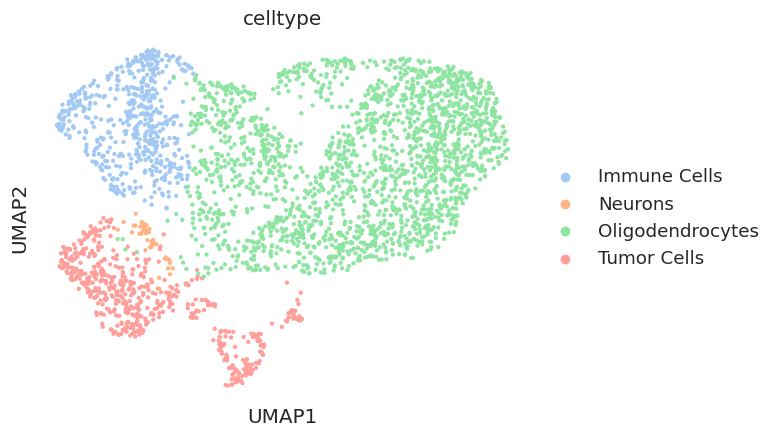

In [288]:
import matplotlib.pyplot as plt
import scanpy as sc

# Plot UMAP without the box around it
sc.pl.umap(rna_perimarginal, color=['celltype'], vmax=20000, show=False)

# Remove the box by hiding spines in the current figure's axis
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

plt.show()


In [290]:
rna_perimarginal.obs['UMAP of Gene Expression in BTROHT02-Perimarginal'] = rna_perimarginal.obs['celltype'] 

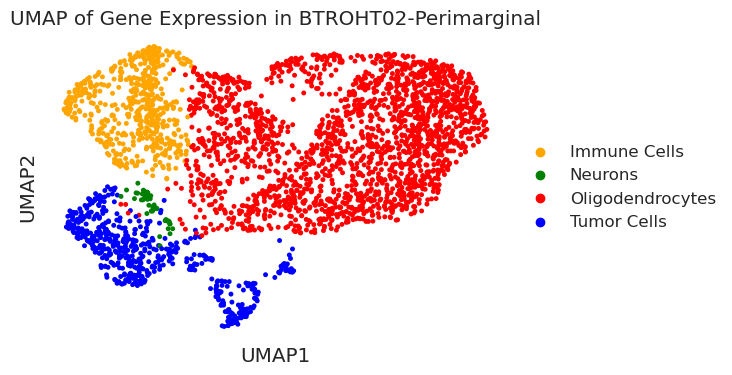

In [291]:
import matplotlib.pyplot as plt
import scanpy as sc

cell_type_colors = {
    'Oligodendrocytes': 'red',
    'Neurons': 'green',
    'Immune Cells': 'orange',
    'Tumor Cells': 'blue'
}

# Create a UMAP plot and prevent it from showing immediately
sc.pl.umap(
    rna_perimarginal, 
    color='UMAP of Gene Expression in BTROHT02-Perimarginal',  # Update this to your actual cell type annotation key
    vmax=20000, 
    show=False, 
    palette=cell_type_colors,
    size=50,  # Adjust size of the dots
    legend_fontsize=12  # Adjust size of legend text
)

# Get the current figure
fig = plt.gcf()  # This gets the current figure object

# Adjust the figure size
fig.set_size_inches(6, 4)  # Adjust width and height

# Remove the box around the plot by hiding the spines
ax = plt.gca()  # Get the current axis
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Save the figure
save_path_png = 'figures/UMAP_BTROHT02_Peri_annotation_plots.jpg'
save_path_pdf = 'figures/UMAP_BTROHT02_Peri_annotation_plots.pdf'
fig.savefig(save_path_png, bbox_inches='tight', dpi=300)  # Save as PNG with tight bounding box
fig.savefig(save_path_pdf, bbox_inches='tight', dpi=300)  # Save as PDF with tight bounding box

# Show the plot
plt.show()


## Cell cycle Analysis 

... storing 'phase' as categorical


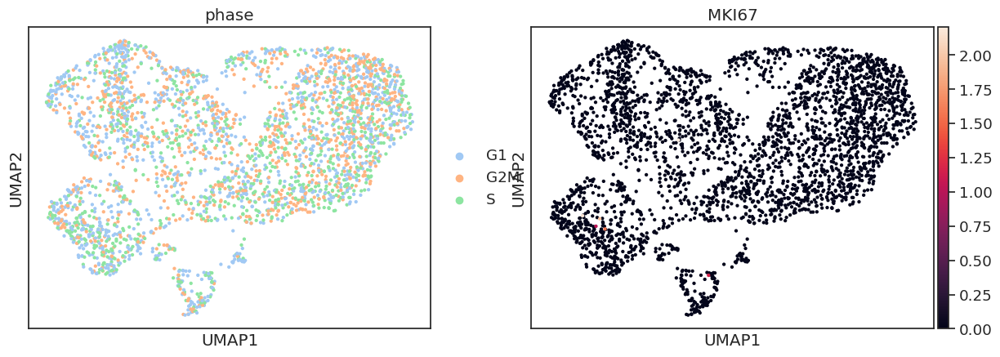

In [292]:
cell_cycle_genes = [x.strip() for x in open('/home/fatemeh.nasrabadi/files/cellcycle/regev_lab_cell_cycle_genes.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in rna_perimarginal.var_names]
sc.tl.score_genes_cell_cycle(rna_perimarginal, s_genes=s_genes, g2m_genes=g2m_genes, use_raw=False)
save_path='_rna_cellcycle.pdf'
sc.pl.umap(rna_perimarginal, color=['phase', 'MKI67'], save=save_path)

In [293]:
#sc.tl.dendrogram(rna_core, groupby='celltype_new_CNV_leiden',)
sc.tl.dendrogram(rna_perimarginal, groupby='celltype',)

In [294]:
sc.tl.dendrogram(rna_perimarginal, groupby='celltype')
sc.tl.rank_genes_groups(rna_perimarginal, groupby='celltype', method='wilcoxon')

result = rna_perimarginal.uns['rank_genes_groups']
gene_names=[]
gene_dict={}
for type in rna_perimarginal.obs['celltype'].unique():
    if type in result['names'].dtype.names:
        top_genes = result['names'][type][:15]
        gene_names.extend(top_genes)
        gene_dict[type]=top_genes
        
gene_dict


{'Oligodendrocytes': array(['IL1RAPL1', 'CERCAM', 'CTNNA3', 'PLP1', 'MBP', 'MAN2A1', 'ST18',
        'PLEKHH1', 'PCDH9', 'TMEM144', 'ABCA2', 'AATK', 'SIK3', 'SLC44A1',
        'TTLL7'], dtype=object),
 'Immune Cells': array(['SLC11A1', 'PLXDC2', 'DOCK4', 'ARHGAP24', 'SAT1', 'MEF2A',
        'SLC1A3', 'BMP2K', 'LRMDA', 'ADAM28', 'FRMD4A', 'FKBP5', 'SLCO2B1',
        'NEAT1', 'USP53'], dtype=object),
 'Tumor Cells': array(['PTPRZ1', 'NRCAM', 'LSAMP', 'LRP1B', 'SNTG1', 'NRXN1', 'CTNNA2',
        'SOX6', 'DTNA', 'RORA', 'GPM6A', 'TRIO', 'KCND2', 'NOVA1',
        'ADGRL3'], dtype=object),
 'Neurons': array(['SNHG14', 'MEG3', 'NRG3', 'RBFOX1', 'SYT1', 'FAM155A', 'RIMS2',
        'GRIK2', 'FGF14', 'FGF12', 'DLGAP1', 'RGS7', 'GRM5', 'CSMD1',
        'OPCML'], dtype=object)}

In [295]:
sc.tl.dendrogram(rna_perimarginal, groupby='leiden',)
sc.tl.rank_genes_groups(rna_perimarginal, groupby='leiden', method='wilcoxon')

result = rna_perimarginal.uns['rank_genes_groups']
gene_names=[]
gene_dict={}
for type in rna_perimarginal.obs['leiden'].unique():
    if type in result['names'].dtype.names:
        top_genes = result['names'][type][:15]
        gene_names.extend(top_genes)
        gene_dict[type]=top_genes
        
gene_dict


/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecell_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:429: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecell_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:431: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecel

{'4': array(['CERCAM', 'IL1RAPL1', 'TTLL7', 'MAN2A1', 'SIK3', 'ERBIN', 'PLP1',
        'PCDH9', 'TMEM144', 'QKI', 'ST18', 'CTNNA3', 'MBP', 'NCAM2',
        'CLASP2'], dtype=object),
 '6': array(['SLC11A1', 'DOCK4', 'PLXDC2', 'ARHGAP24', 'MEF2A', 'LRMDA',
        'FRMD4A', 'BMP2K', 'FKBP5', 'SLCO2B1', 'SLC1A3', 'SAT1', 'ADAM28',
        'STAB1', 'USP53'], dtype=object),
 '2': array(['IL1RAPL1', 'SIK3', 'ANK3', 'CTNNA3', 'PCDH9', 'PIP4K2A',
        'SLC44A1', 'SLC24A2', 'ERBIN', 'PPP2R2B', 'DLG2', 'NKAIN2',
        'PALM2-AKAP2', 'PDE4B', 'FRMD5'], dtype=object),
 '10': array(['ARHGAP24', 'PLXDC2', 'UGT8', 'SLC11A1', 'RYBP', 'BMP2K', 'RAB40B',
        'KIF13B', 'C10orf90', 'UNC5C', 'ADAM28', 'LINC00609',
        'SLC7A14-AS1', 'AGTPBP1', 'LINC00639'], dtype=object),
 '16': array(['GFAP', 'CST3', 'RPL37A', 'CRYAB', 'CLU', 'ACTB', 'FTL', 'RPL41',
        'SPARC', 'S100A6', 'RPS28', 'PTGDS', 'EEF1A1', 'APOE', 'GAPDH'],
       dtype=object),
 '8': array(['SRGN', 'PLXDC2', 'EGR3', 'SAT1', 'SL

In [296]:
celltype_genes = [
    
    # Microglial markers
    'SLC11A1', 'PLXDC2', 'DOCK4', 'ARHGAP24', 'SAT1',
    
    # Neuron markers
    'SYT1', 'RIMS2', 'DLGAP2', 'GRIN2B', 'CCSER1',
    
    # Oligodendrocyte markers
    'MBP', 'CTNNA3', 'EDIL3', 'MAN2A1', 'PIP4K2A',
    
    # Tumor markers
    'PTPRZ1', 'LHFPL3', 'SEMA5A', 'SOX6', 'BCAN'
]


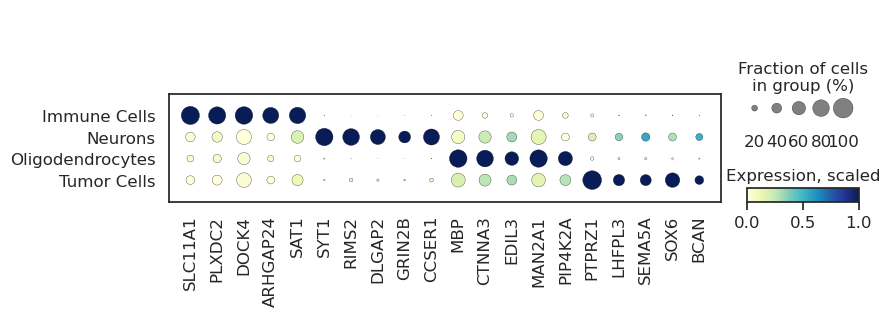

In [298]:
sns.set_theme(style="white", palette="pastel", font_scale = 1.2, rc={"lines.linewidth": 0.5})
save_path='_rna_marker_genes.pdf'

sc.pl.dotplot(rna_perimarginal, var_names=celltype_genes, 
              groupby='celltype',colorbar_title='Expression, scaled',
              #categories_order=[ 'Brain neurons', 'mOli', 'Microglia'  ,'Astrocytes', 'Tumor cells' ], 
              standard_scale='var', 
              cmap='YlGnBu',  
              
              dendrogram=False,save=save_path)

... storing 'celltype' as categorical


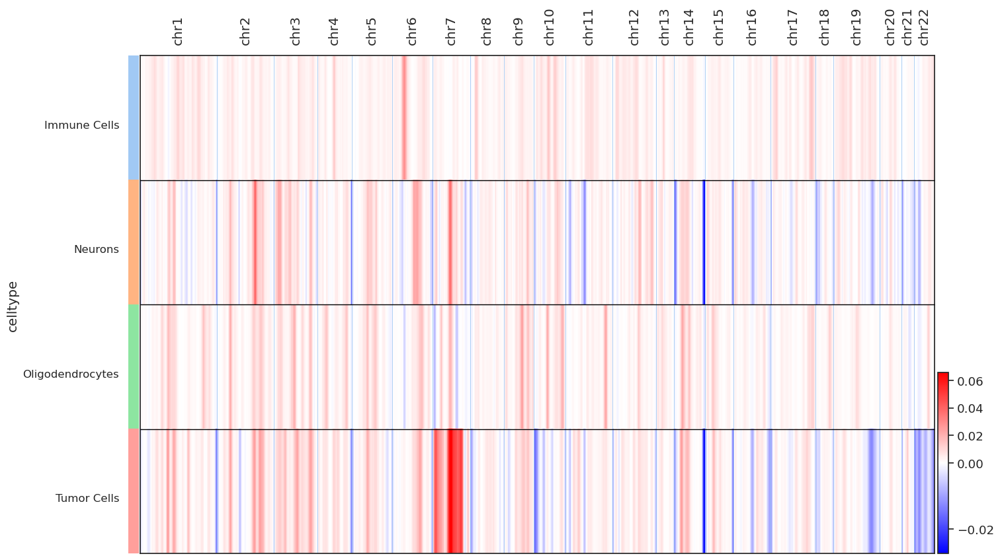

<Figure size 640x480 with 0 Axes>

In [300]:
import matplotlib.pyplot as plt

# Step 1: Map the new celltype labels
adata_inf.obs['celltype'] = rna_perimarginal.obs['celltype']

# Step 2: Set all the colors to a single color (e.g., grey)
uniform_color = '#808080'  # Grey color for all cell types
adata_inf.uns['celltype_new_colors'] = [uniform_color] * len(adata_inf.obs['celltype'].unique())

# Step 3: Plot the heatmap with the uniform coloring and save the figure
save_path = '_rna_cnv_heatmap_celltype.pdf'
cnv.pl.chromosome_heatmap_summary(adata_inf, groupby="celltype", save=save_path)

# Optionally save in other formats
save_path_png = 'figures/UMAP_BTROHT02-perimarginal_CNV_annotated_plots.jpg'
save_path_pdf = 'figures/UMAP_BTROHT02-perimarginal_CNV_annotated_plots.pdf'
fig = plt.gcf()  # Get the current figure
fig.savefig(save_path_png, bbox_inches='tight', dpi=300)  # Save as PNG with tight bounding box
fig.savefig(save_path_pdf, bbox_inches='tight', dpi=300)  # Save as PDF with tight bounding box

# Step 4: Display the heatmap
plt.show()


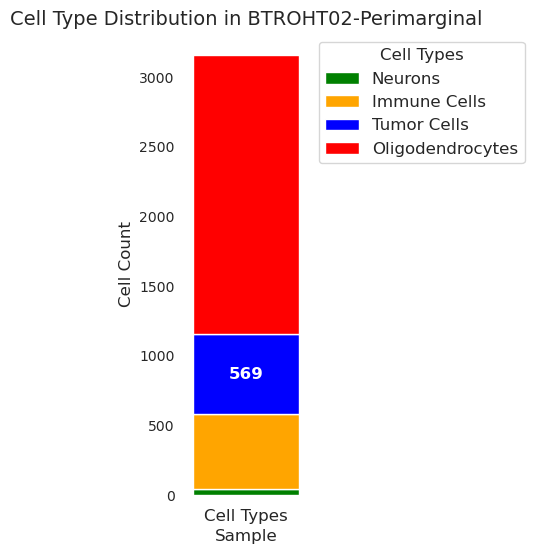

In [301]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming `rna_perimarginal` is your AnnData object
celltype_counts = rna_perimarginal.obs['UMAP of Gene Expression in BTROHT02-Perimarginal'].value_counts()

# Sort cell types in ascending order so the largest count is on top
celltype_counts = celltype_counts.sort_values(ascending=True)

# Define colors for each cell type
celltype_color_map = {
    'Oligodendrocytes': 'red',
    'Neurons': 'green',
    'Immune Cells': 'orange',
    'Tumor Cells': 'blue'
}

# Map colors based on the sorted cell types
colors = [celltype_color_map.get(cell_type, 'gray') for cell_type in celltype_counts.index]

# Initialize the plot
plt.figure(figsize=(1.5, 6))

# Plotting a stacked bar with each section representing a cell type count
bottom = 0
for count, color, cell_type in zip(celltype_counts.values, colors, celltype_counts.index):
    plt.bar(
        x=['Cell Types'], 
        height=[count], 
        color=color, 
        bottom=bottom, 
        label=cell_type
    )
    # Update the bottom position for the next cell type
    bottom += count
    
    # Add the number of tumor cells inside the "Tumor Cells" section of the bar
    if cell_type == 'Tumor Cells' and count > 0:
        plt.text(
            0,  # X position (center of the bar)
            bottom - count / 2,  # Y position (centered inside the tumor cells section)
            str(count),  # The count of tumor cells
            ha='center',  # Horizontal alignment (centered)
            va='center',  # Vertical alignment (centered)
            fontsize=12,  # Font size
            color='white',  # Text color (white to contrast with the bar color)
            weight='bold'  # Bold text
        )

# Add labels and title
plt.xlabel("Sample", fontsize=12)
plt.ylabel("Cell Count", fontsize=12)
plt.title("Cell Type Distribution in BTROHT02-Perimarginal", fontsize=14)

# Set legend with color references for each cell type
plt.legend(title="Cell Types", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12, title_fontsize=12)

# Adjust y-axis tick labels
plt.yticks(fontsize=10)

# Ensure consistent font size for all text
plt.xticks(fontsize=12)

# Remove the box around the plot
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

plt.show()


## Save Final Version 

In [302]:
BASE_DIR

'/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT02/Perimarginal'

In [307]:
# Save the file
rna_perimarginal.write(f'{BASE_DIR}/BTROHT02_5_peri_rna_ANNOTATED_FINAL.h5ad')

## Reading RNA and ATAC DATA

In [14]:
import scanpy as sc

import muon as mu

from muon import atac as ac
from muon import prot as pt

import scipy
import numpy as np 
import pandas as pd
 
from matplotlib import pyplot as plt
import seaborn as sns

import pandas as pd


In [15]:
rna_perimarginal = sc.read(f'{BASE_DIR}/BTROHT02_5_peri_rna_ANNOTATED_FINAL.h5ad')

In [16]:
rna_perimarginal

AnnData object with n_obs × n_vars = 3156 × 36588
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex', 'cell_typist_predicted_labels_Adult_Human_PrefrontalCortex', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'celltypist_conf_score_Adult_Human_PrefrontalCortex', 'cnv_raw_l1', 'cnv_raw_l2', 'cnv_score', 'cnv_leiden', 'celltype', 'UMAP of Gene Expression in BTROHT02-Perimarginal', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'UMAP of Gene Expression in BTROHT02-Perimarginal_colors', 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex_colors', 'cell_typist_predicted_labels_Adult_Human_PrefrontalCortex_colors', 'celltype_colors', 'cnv_leiden_colors

In [17]:
BASE_DIR

'/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT02/Perimarginal'

In [18]:
atac = sc.read(f'{BASE_DIR}/BTROHT02_3_peri_raw_atac.h5ad')

## ATAC seq Analysis 

In [ ]:
#atac = mdata_perimarginal.mod['atac']
#atac

## QC for ATAC 

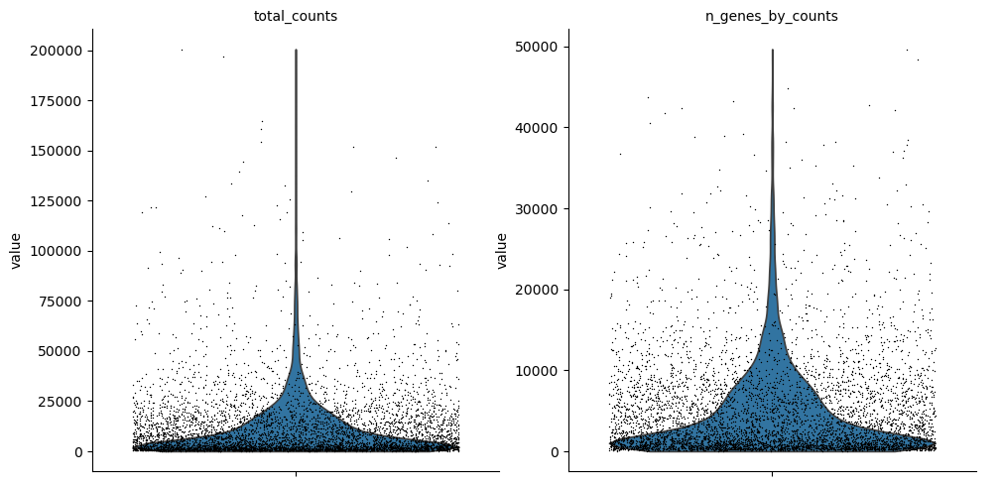

In [19]:
sc.pp.calculate_qc_metrics(atac, percent_top=None, log1p=False, inplace=True)

save_path = 'QC_ATAC_before_filtration.pdf'
sc.pl.violin(atac, ['total_counts', 'n_genes_by_counts'], jitter=0.4, multi_panel=True, save=save_path)

## Nucleosome signal

In [15]:
#Nuc signeal

# Calculate the nucleosome signal across cells
# set n=10e3*atac.n_obs for rough estimate but faster run time
ac.tl.nucleosome_signal(atac, n=10e3 * atac.n_obs)

[W::hts_idx_load3] The index file is older than the data file: /group/sottoriva/00-PROCESSED_DATA/2023-ROVIGO/BTROHT02/BTROHT02_perimarginal_tissue/multiome/LAZ_314/atac_fragments.tsv.gz.tbi
Reading Fragments: 100%|██████████| 56640000/56640000 [02:14<00:00, 421496.08it/s]


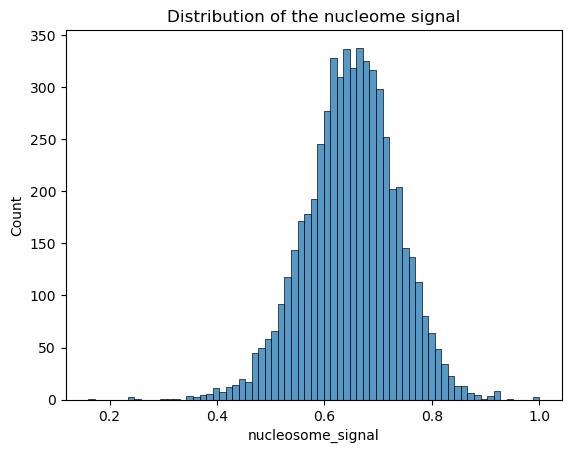

In [16]:
sns.histplot(atac.obs, x="nucleosome_signal")
plt.title("Distribution of the nucleome signal")
plt.show()

## Filtration

In [17]:
mu.pp.filter_var(atac, "n_cells_by_counts", lambda x: x >= 5)

In [18]:
# mu.pp.filter_obs(
#     atac,
#     "tss_score",
#     lambda x: x >= 2,
# )
print(f"Number of cells after filtering on tss_score: {atac.n_obs}")
mu.pp.filter_obs(atac, "nucleosome_signal", lambda x: x <= 2)
print(f"Number of cells after filtering on nucleosome_signal: {atac.n_obs}")

Number of cells after filtering on tss_score: 5664
Number of cells after filtering on nucleosome_signal: 5664


In [19]:
mu.pp.filter_obs(atac, 'n_genes_by_counts', lambda x: (x >= 2000) & (x <= 50000))
# This is analogous to
#   sc.pp.filter_cells(atac, max_genes=15000)
#   sc.pp.filter_cells(atac, min_genes=2000)
# but does in-place filtering avoiding copying the object

#mu.pp.filter_obs(
#    atac,
#    "total_counts",
#    lambda x: (x >= 500) & (x <= 150000), 
#)
print(f"Number of cells after filtering on n fragments: {atac.n_obs}")

Number of cells after filtering on n fragments: 3142


In [20]:
# Define the metrics
atac_metrics = {
    "atac_n_cells_by_counts": 5,
    "atac_n_genes_by_counts_bottom": 2000,
    "atac_n_genes_by_counts_top": 50000,
   # "atac_total_counts_top": 500,
   # "atac_total_counts_bottom": 150000,
}

# Define the file path
file_path = "QC_filtration_metrics.txt"

with open(file_path, 'a') as file:
    for key, value in atac_metrics.items():
        file.write(f"{key}: {value}\n")

print(f"Metrics have been written and appended to {file_path}")

Metrics have been written and appended to QC_filtration_metrics.txt


In [21]:
atac.write(f'{BASE_DIR}/BTROHT02_6_peri_atac_QcFiltered.h5ad')

## SnapATAC and filtration

In [23]:
import snapatac2 as snap
import numpy as np
import scanpy as sc

snap.__version__

'2.7.0'

In [24]:
#Choose barcodes from filtered data (filtered with muon)
valid_barcodes=atac.obs_names
len(valid_barcodes)

3142

In [25]:
BASE_DIR

'/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT02/Perimarginal'

In [30]:
!cd Snap

In [31]:
!mkdir tmpdir

In [35]:
%%time

data = snap.pp.import_data(
    f'{BASE_DIR}/Snap/atac_fragments.tsv',
    chrom_sizes=snap.genome.hg38,
    file=f'{BASE_DIR}/Snap/BTROHT_02_perimarginal_snap.h5ad',  # Optional
    sorted_by_barcode=False, whitelist=valid_barcodes,
    tempdir=f'{BASE_DIR}/Snap/tmpdir'
)
data


CPU times: user 6min 58s, sys: 19 s, total: 7min 17s
Wall time: 6min 22s


AnnData object with n_obs x n_vars = 3142 x 0 backed at '/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT02/Perimarginal/Snap/BTROHT_02_perimarginal_snap.h5ad'
    obs: 'n_fragment', 'frac_dup', 'frac_mito'
    uns: 'reference_sequences'
    obsm: 'fragment_paired'

In [ ]:
data.close()

In [ ]:
!pwd

# Read Snap ATAC

In [37]:
data=snap.read(f'{BASE_DIR}/Snap/BTROHT_02_perimarginal_snap.h5ad', )
data

AnnData object with n_obs x n_vars = 3142 x 0 backed at '/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT02/Perimarginal/Snap/BTROHT_02_perimarginal_snap.h5ad'
    obs: 'n_fragment', 'frac_dup', 'frac_mito'
    uns: 'reference_sequences'
    obsm: 'fragment_paired'

## QC

2024-11-28 13:44:08 - INFO - Computing fragment size distribution...


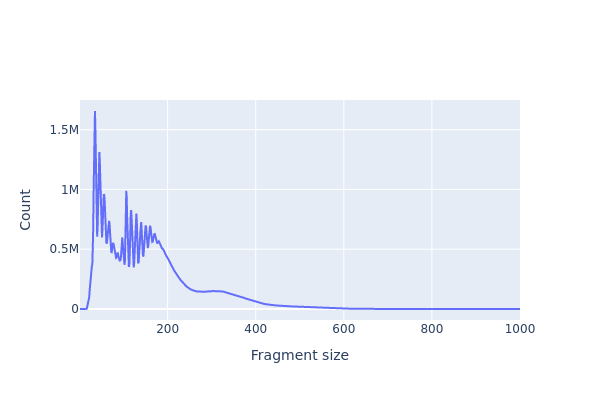

In [38]:
snap.pl.frag_size_distr(data, interactive=False, out_file='figures/QC_ATAC_frag_size_distr.pdf')

In [39]:
#%%time
snap.metrics.tsse(data, snap.genome.hg38)

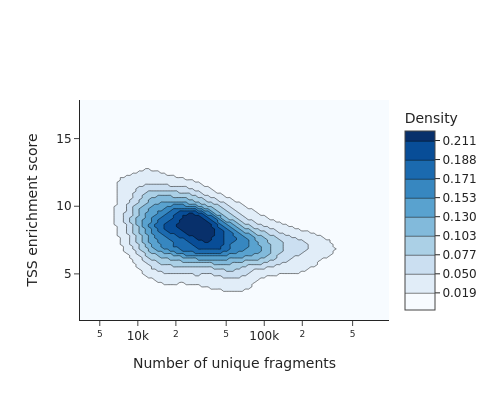

In [40]:
snap.pl.tsse(data, interactive=False, out_file='figures/QC_ATAC_tsse_frags.pdf')

In [41]:
data.obs['tsse'].min()

/tmp/ipykernel_3304329/1383754455.py:1: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'



2.98989898989899

In [42]:
data.obs['tsse'].mean()

/tmp/ipykernel_3304329/921509436.py:1: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'



7.942923541264516

In [43]:
## Add tile matrix, select features, remove doublets, 

In [44]:
%%time
snap.pp.add_tile_matrix(data) #add tile matrix with 500 bp window

CPU times: user 1min 20s, sys: 4.18 s, total: 1min 24s
Wall time: 54.7 s


In [45]:
snap.pp.select_features(data, n_features=25000) #feature selection to find the most variable
%%time
snap.pp.scrublet(data) #doublet identification
snap.pp.filter_doublets(data) #doublet removal
data

2024-11-28 13:46:48 - INFO - Selected 25000 features.
UsageError: Line magic function `%%time` not found.


In [46]:
data.write(f'{BASE_DIR}/Snap/BTROHT_02_perimarginal_snap_filtered.h5ad', )

In [47]:
data.close()

In [136]:
data = snap.read(f'{BASE_DIR}/Snap/BTROHT_02_perimarginal_snap_filtered.h5ad', )

In [137]:
data

AnnData object with n_obs x n_vars = 3142 x 6062095 backed at '/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT02/Perimarginal/Snap/BTROHT_02_perimarginal_snap_filtered.h5ad'
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden'
    var: 'count', 'selected'
    uns: 'spectral_eigenvalue', 'frac_overlap_TSS', 'TSS_profile', 'library_tsse', 'frag_size_distr', 'reference_sequences'
    obsm: 'X_spectral', 'X_umap', 'fragment_paired'
    obsp: 'distances'

## Reducing Dimention 

In [138]:
#%%time
snap.tl.spectral(data, n_comps=40)

In [139]:
#%%time
snap.tl.umap(data, )

/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecell_env/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [140]:
#%%time
snap.pp.knn(data)
snap.tl.leiden(data,resolution= 2)

In [143]:
#data2=data[data.obs[data.obs['leiden']=='4'].index, :]

In [144]:
# Subset the AnnData object for Leiden cluster '4'
#data2 = data[data.obs['leiden'] == '4', :]

# Alternatively, using .loc[] explicitly
#data2 = data.loc[data.obs['leiden'] == '4', :]


In [145]:
# Subset the AnnData object to only include cells in Leiden cluster '4'
#data2 = data[data.obs['leiden'] == '4'].copy()

# Alternatively, using .loc explicitly (both work)
#data2 = data.loc[data.obs['leiden'] == '4', :].copy()


In [146]:
# Filter obs to get only rows where 'leiden' is '4', then extract the index (barcodes)
#leiden_cluster_4_barcodes = data.obs[data.obs['leiden'] == '4'].index

# Convert to a list if needed
#leiden_cluster_4_list = leiden_cluster_4_barcodes.tolist()

# Print the list of barcodes
#print(leiden_cluster_4_list)


In [148]:
#data.obs_names

In [115]:
type(data)

AnnData

In [120]:
data.obs['leiden'].shape

/tmp/ipykernel_885625/1775937936.py:1: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'



(3142,)

In [149]:
data

AnnData object with n_obs x n_vars = 3142 x 6062095 backed at '/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT02/Perimarginal/Snap/BTROHT_02_perimarginal_snap_filtered.h5ad'
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden'
    var: 'count', 'selected'
    uns: 'spectral_eigenvalue', 'frac_overlap_TSS', 'TSS_profile', 'library_tsse', 'frag_size_distr', 'reference_sequences'
    obsm: 'X_spectral', 'X_umap', 'fragment_paired'
    obsp: 'distances'

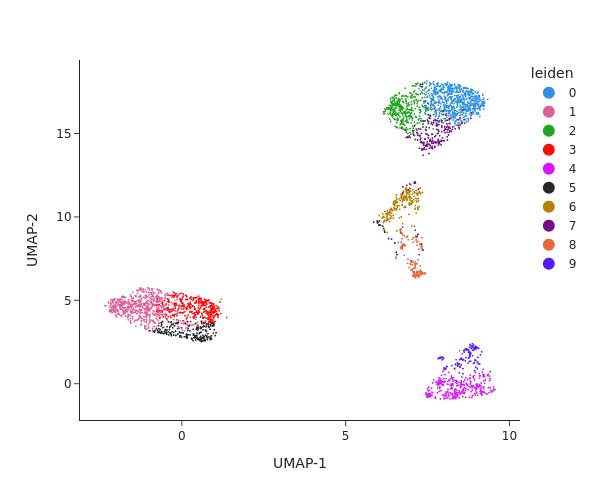

In [150]:
snap.pl.umap(data, color='leiden', interactive=False, height=500)

In [151]:
data

AnnData object with n_obs x n_vars = 3142 x 6062095 backed at '/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT02/Perimarginal/Snap/BTROHT_02_perimarginal_snap_filtered.h5ad'
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden'
    var: 'count', 'selected'
    uns: 'spectral_eigenvalue', 'frac_overlap_TSS', 'TSS_profile', 'library_tsse', 'frag_size_distr', 'reference_sequences'
    obsm: 'X_spectral', 'X_umap', 'fragment_paired'
    obsp: 'distances'

In [54]:
data.close()

In [55]:
data

Closed AnnData object

## Cluster Annotation 

In [132]:
data = snap.read(f'{BASE_DIR}/Snap/BTROHT_02_perimarginal_snap_filtered.h5ad', )
data

AnnData object with n_obs x n_vars = 3142 x 6062095 backed at '/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT02/Perimarginal/Snap/BTROHT_02_perimarginal_snap_filtered.h5ad'
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden'
    var: 'count', 'selected'
    uns: 'frag_size_distr', 'TSS_profile', 'frac_overlap_TSS', 'reference_sequences', 'library_tsse', 'spectral_eigenvalue'
    obsm: 'X_umap', 'fragment_paired', 'X_spectral'
    obsp: 'distances'

In [158]:
%%time
gene_matrix = snap.pp.make_gene_matrix(data, snap.genome.hg38, )
gene_matrix

/home/fatemeh.nasrabadi/anaconda3/envs/anaconda_singlecell_env/lib/python3.9/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning:

Transforming to str index.



CPU times: user 3min 31s, sys: 10.9 s, total: 3min 42s
Wall time: 1min 12s


AnnData object with n_obs × n_vars = 3142 × 60606
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden'

In [153]:
# Initialize all values in gene_matrix.obs['annotation'] as None
gene_matrix.obs['leiden'] = None

# Update the annotation for cells that are present in both gene_matrix.obs and data.obs
common_cells = gene_matrix.obs.index.intersection(rna_perimarginal.obs.index)
gene_matrix.obs.loc[common_cells, 'leiden'] = rna_perimarginal.obs.loc[common_cells, 'leiden']

In [58]:
# Initialize all values in gene_matrix.obs['annotation'] as None
gene_matrix.obs['celltype'] = None

# Update the annotation for cells that are present in both gene_matrix.obs and data.obs
common_cells = gene_matrix.obs.index.intersection(rna_perimarginal.obs.index)
gene_matrix.obs.loc[common_cells, 'celltype'] = rna_perimarginal.obs.loc[common_cells, 'celltype']

In [59]:
gene_matrix

AnnData object with n_obs × n_vars = 3142 × 60606
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden', 'celltype'

In [159]:
# Copy over UMAP embedding
gene_matrix.obsm["X_umap"] = data.obsm["X_umap"]

In [61]:
# Count occurrences of each type in the 'annotation' column
annotation_counts = gene_matrix.obs['celltype'].value_counts()

# Display the counts
print(annotation_counts)


celltype
Oligodendrocytes    1170
Tumor Cells          516
Immune Cells         449
Neurons               38
Name: count, dtype: int64


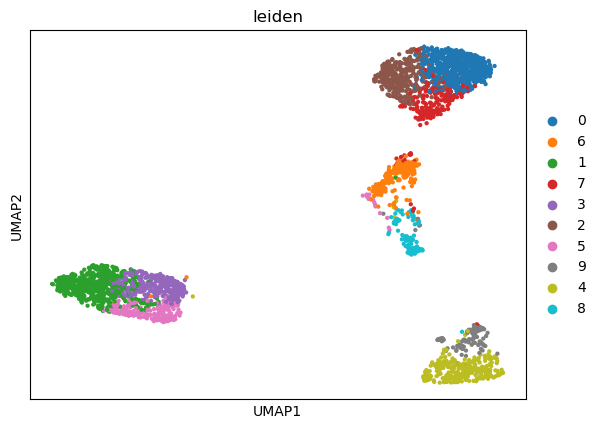

In [160]:
markers = ['leiden']
sc.pl.umap(gene_matrix, use_raw=False, color= markers , ncols=2)

In [161]:
print(type(gene_matrix.obs))

<class 'pandas.core.frame.DataFrame'>


In [170]:
gene_matrix.write('/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT01/Aggregated/gene_matrix_annotationforperi2.h5ad')

In [163]:
markers = ['leiden']
sc.pl.umap(gene_matrix, use_raw=False, color= markers , ncols=2)
gene_matrix2=gene_matrix[gene_matrix.obs[gene_matrix.obs['leiden']=='4'].index, :]
gene_matrix.obs_names

In [168]:
gene_matrix2

View of AnnData object with n_obs × n_vars = 319 × 60606
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden'
    uns: 'leiden_colors'
    obsm: 'X_umap'

In [162]:
gene_matrix.obs_names

Index(['AAACATGCAACCCTCC-1', 'AAACATGCAGTAAAGC-1', 'AAACCGAAGCGTGCGT-1',
       'AAACCGGCACAAAGCG-1', 'AAACGCGCAATGAATG-1', 'AAACGCGCACAATACT-1',
       'AAACGGATCCAACTGG-1', 'AAAGCAAGTTCATCTA-1', 'AAAGCCCGTGTTGCAA-1',
       'AAAGCCCGTTTCGCGC-1',
       ...
       'TTTGTCTAGGTGCGGA-1', 'TTTGTCTAGGTGTCCA-1', 'TTTGTGAAGGGATGAC-1',
       'TTTGTGAAGGTCCTGA-1', 'TTTGTGAAGTAAGTCC-1', 'TTTGTGTTCGCACAAT-1',
       'TTTGTTGGTAGGATTT-1', 'TTTGTTGGTCAAAGGG-1', 'TTTGTTGGTTAGGCGT-1',
       'TTTGTTGGTTGGTTAG-1'],
      dtype='object', length=3142)

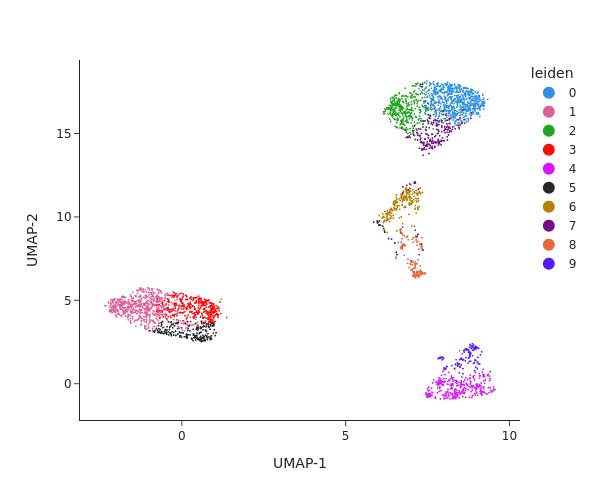

In [157]:
snap.pl.umap(data, color='leiden', interactive=False, height=500)

In [68]:
gene_matrix.obs['UMAP of ATAC in BTROH02-Perimarginal'] = gene_matrix.obs['celltype'] 

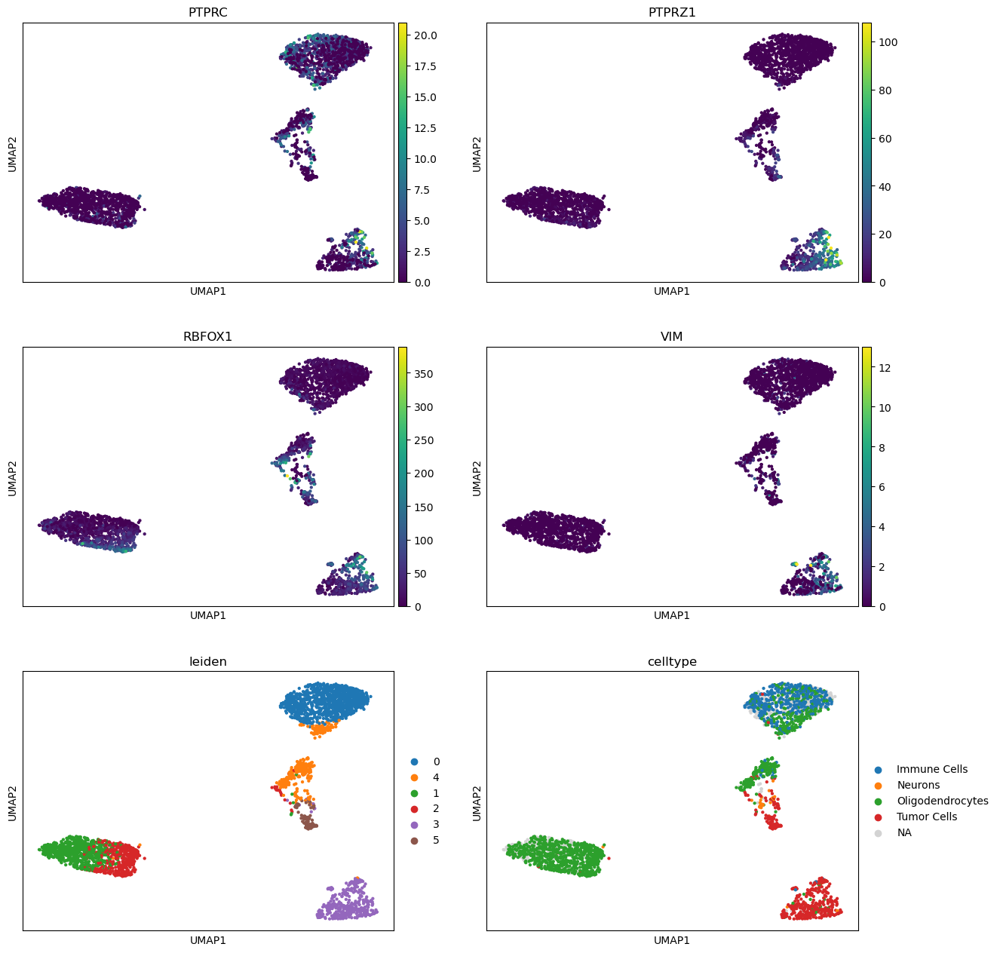

In [69]:
markers = ['PTPRC', 'PTPRZ1', 'RBFOX1','VIM', 'leiden','celltype']
sc.pl.umap(gene_matrix, use_raw=False, color= markers , ncols=2)

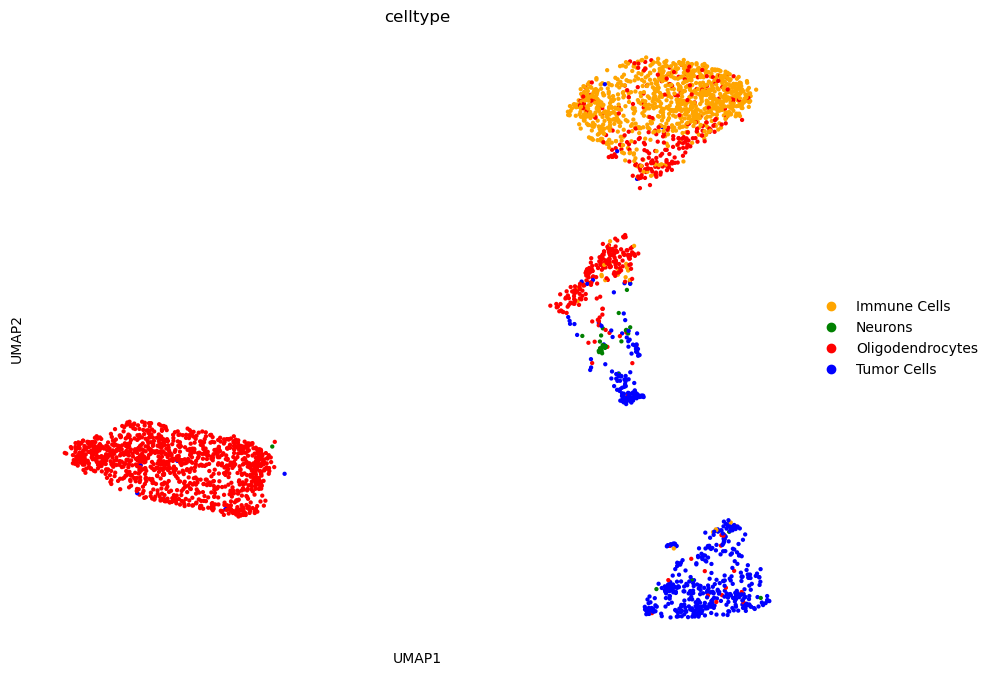

In [75]:
import matplotlib.pyplot as plt
import scanpy as sc
import os


# Define the markers and their corresponding colors
markers = ['celltype']
color_map = {
    'Oligodendrocytes': 'red',
    'Neurons': 'green',
    'Immune Cells': 'orange',
    'Tumor Cells': 'blue'
}

# Update NA values in 'annotation' based on Leiden clusters
na_mask = gene_matrix.obs['celltype'].isna()  # Identify NA cells
gene_matrix.obs.loc[na_mask & (gene_matrix.obs['leiden'] == '1'), 'celltype'] = 'Oligodendrocytes'
gene_matrix.obs.loc[na_mask & (gene_matrix.obs['leiden'] == '2'), 'celltype'] = 'Oligodendrocytes'
gene_matrix.obs.loc[na_mask & (gene_matrix.obs['leiden'] == '3'), 'celltype'] = 'Tumor Cells'
gene_matrix.obs.loc[na_mask & (gene_matrix.obs['leiden'] == '4'), 'celltype'] = 'Oligodendrocytes'
gene_matrix.obs.loc[na_mask & (gene_matrix.obs['leiden'] == '5'), 'celltype'] = 'Tumor Cells'
gene_matrix.obs.loc[na_mask & (gene_matrix.obs['leiden'] == '0'), 'celltype'] = 'Immune Cells'



# Create the UMAP plot with specified colors
sc.pl.umap(
    gene_matrix, 
    use_raw=False, 
    color=markers, 
    ncols=2,
    palette=color_map,
    show=False
)

# Ensure the output directory exists
output_dir = 'figures'
os.makedirs(output_dir, exist_ok=True)

# After the plot is generated, adjust the figure size using matplotlib
plt.gcf().set_size_inches(10, 8)  # Adjust the size of the plot here

# Remove the box around the plot
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

# Save the figure
fig = plt.gcf()  # Capture current figure
save_path_png = os.path.join(output_dir, 'Peri_atac_annotated_plots.jpg')
save_path_pdf = os.path.join(output_dir, 'Peri_atac_annotated_plots.pdf')
fig.savefig(save_path_png, bbox_inches='tight')
fig.savefig(save_path_pdf, bbox_inches='tight')

# Show the plot
plt.show()


In [ ]:
gene_matrix

In [76]:
gene_matrix.write(f'{BASE_DIR}/BTROHT02_7_peri_gene_matrix_ANNOTATED_FINAL.h5ad')

In [22]:
gene_matrix=sc.read(f'{BASE_DIR}/BTROHT02_7_peri_gene_matrix_ANNOTATED_FINAL.h5ad')

In [34]:
import snapatac2 as snap
snap.tl.spectral(gene_matrix, n_comps=40)
snap.tl.umap(gene_matrix, )
snap.tl.leiden(gene_matrix,resolution = 0.5)

NameError: Please call `select_features` first or explicitly set `features = None`

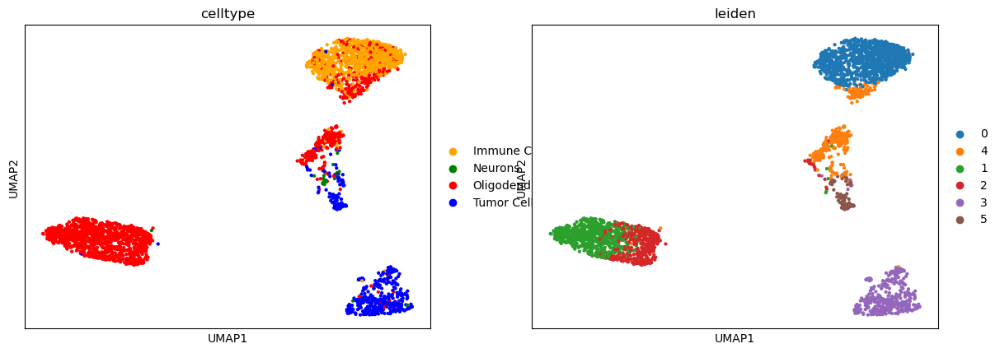

In [30]:
sc.pl.umap(gene_matrix, color = ['celltype' , 'leiden'])

In [27]:
gene_matrix

AnnData object with n_obs × n_vars = 3142 × 60606
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden', 'celltype', 'UMAP of ATAC in BTROH01-Perimarginal', 'UMAP of ATAC in BTROH02-Perimarginal'
    uns: 'celltype_colors', 'leiden_colors'
    obsm: 'X_umap'

In [79]:
atac

AnnData object with n_obs × n_vars = 3142 × 98738
    obs: 'n_genes_by_counts', 'total_counts', 'nucleosome_signal'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'atac', 'files'

## Normalization

In [80]:
atac= atac[list(set(gene_matrix.obs_names) & set(rna_perimarginal.obs_names)), :]
atac

View of AnnData object with n_obs × n_vars = 2173 × 98738
    obs: 'n_genes_by_counts', 'total_counts', 'nucleosome_signal'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'atac', 'files'

In [81]:
atac.layers["counts"] = atac.X

/tmp/ipykernel_3304329/1225148405.py:1: ImplicitModificationWarning:

Setting element `.layers['counts']` of view, initializing view as actual.



In [82]:
ac.pp.tfidf(atac, scale_factor=1e4)

In [83]:
sc.pp.normalize_per_cell(atac, counts_per_cell_after=1e4)
sc.pp.log1p(atac)

In [84]:
sc.pp.highly_variable_genes(atac, min_mean=0.05, max_mean=1.5, min_disp=.5)

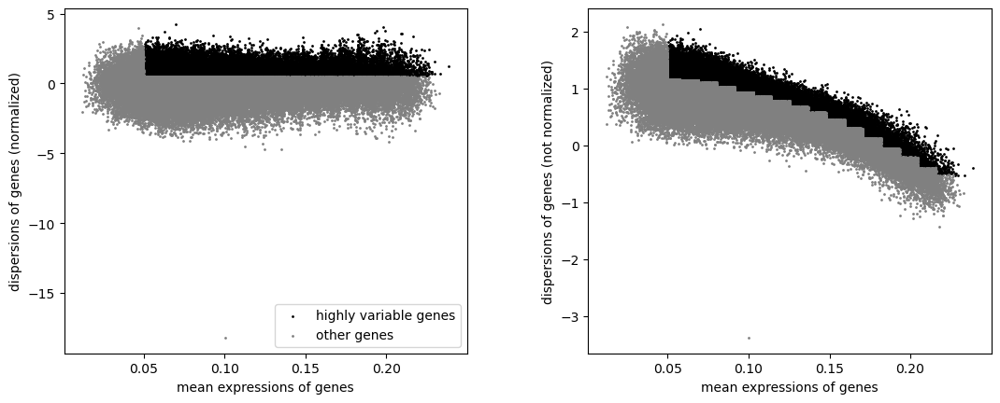

In [85]:
sc.pl.highly_variable_genes(atac)

In [86]:
np.sum(atac.var.highly_variable)

28210

In [87]:
atac.raw = atac

## LSI, gragh on LSI, PCA

In [88]:
ac.tl.lsi(atac)

In [89]:
atac.obsm['X_lsi'] = atac.obsm['X_lsi'][:,1:]
atac.varm["LSI"] = atac.varm["LSI"][:,1:]
atac.uns["lsi"]["stdev"] = atac.uns["lsi"]["stdev"][1:] #We find the first component is typically associated with number of peaks or counts per cell so it is reasonable to remove it

In [90]:
sc.pp.neighbors(atac, use_rep="X_lsi", n_neighbors=10, n_pcs=30)

In [91]:
sc.pp.scale(atac)
sc.tl.pca(atac)

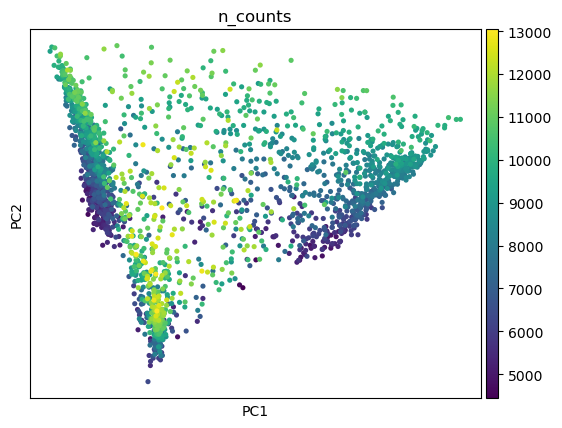

In [92]:
sc.pl.pca(atac, color= ["n_counts"])

In [93]:
sc.tl.umap(atac, min_dist=0.05)

In [94]:
atac.obs['celltype_from_gex']=rna_perimarginal.obs['celltype'].reindex(atac.obs_names)

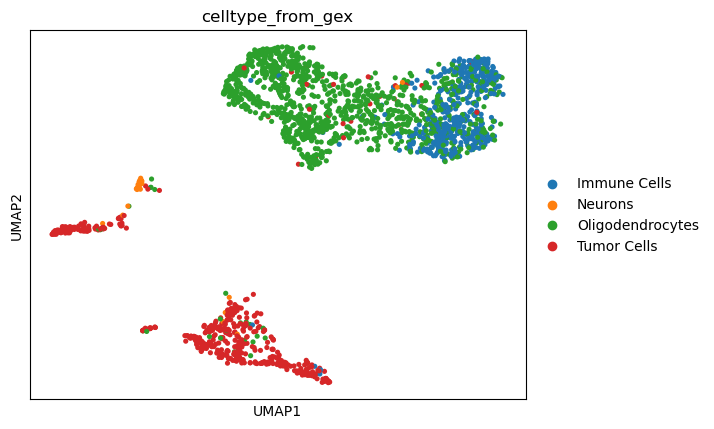

In [95]:
sc.pl.umap(atac, color=["celltype_from_gex"])

## Graph on PCA 

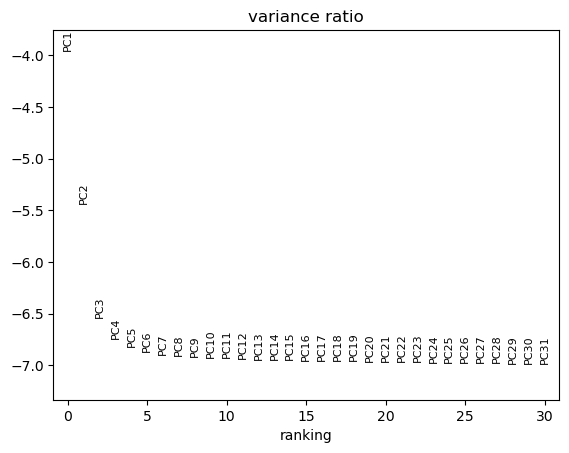

In [96]:
sc.pl.pca_variance_ratio(atac, log=True, )

In [97]:
sc.pp.neighbors(atac, n_neighbors=10, n_pcs=20)

In [98]:
sc.tl.leiden(atac, resolution=.6)

/tmp/ipykernel_3304329/4120330705.py:1: FutureWarning:

In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.



In [99]:
sc.tl.umap(atac, spread=1, min_dist=.1, random_state=20)

In [100]:
#atac.obs['celltype_from_atac']=gene_matrix.obs['celltype_final'].reindex(atac.obs_names)
#atac.obs['celltype_from_gex']=rna.obs['celltype_with_tumor'].reindex(atac.obs_names)

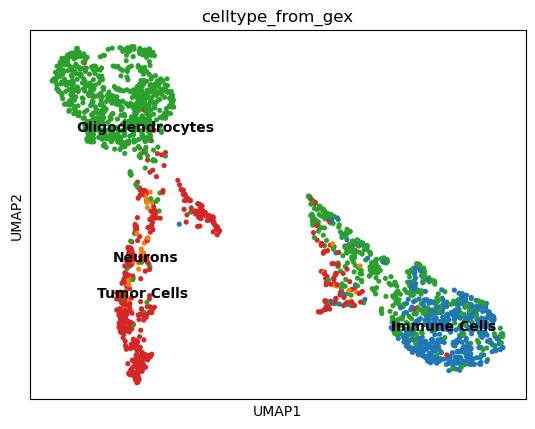

In [101]:
sc.pl.umap(atac, color=["celltype_from_gex"], legend_loc="on data")

## For CONGAS 

### BARCODES

In [9]:
!ls

'annotation for each sample 2 just perimarginal_ 1 of November.ipynb'
'annotation for each sample 2 perimarginal-final october 16th.ipynb'
 BTROHT02_1_peri_mdata_rna_atac.h5ad
 BTROHT02_2_peri_raw_rna.h5ad
 BTROHT02_3_peri_raw_atac.h5ad
 BTROHT02_4_peri_rna_QcFiltered.h5ad
 BTROHT02_5_peri_rna_ANNOTATED_FINAL.h5ad
 BTROHT02_6_peri_atac_QcFiltered.h5ad
 BTROHT02_7_peri_gene_matrix_ANNOTATED_FINAL.h5ad
 BTROHT02_8_peri_atac_ANNOTATED_FINAL.h5ad
 CONGAS
 data
 figures
 PERI_B2_27_NOV_ANNOTED_CONGAS.ipynb
 QC_filtration_metrics.txt
 Snap


In [10]:
gene_matrix=sc.read(f'{BASE_DIR}/BTROHT02_7_peri_gene_matrix_ANNOTATED_FINAL.h5ad')

In [11]:
gene_matrix

AnnData object with n_obs × n_vars = 3142 × 60606
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden', 'celltype', 'UMAP of ATAC in BTROH01-Perimarginal', 'UMAP of ATAC in BTROH02-Perimarginal'
    uns: 'celltype_colors', 'leiden_colors'
    obsm: 'X_umap'

In [12]:
gene_matrix.obs['celltype'].value_counts()

celltype
Oligodendrocytes    1590
Immune Cells         972
Tumor Cells          542
Neurons               38
Name: count, dtype: int64

In [13]:
write_dataset(pd.DataFrame(gene_matrix.obs['celltype']),
               f'{BASE_DIR}/CONGAS/BTROHT02_peri_barcodes_all.tsv')

In [14]:
write_dataset(pd.DataFrame(gene_matrix.obs[gene_matrix.obs['celltype'].isin(['Tumor Cells'])]['celltype']),
               f'{BASE_DIR}/CONGAS/BTROHT02_peri_barcodes_tumorcells_.tsv')

In [15]:
BASE_DIR

'/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT02/Perimarginal'

## Segment file

In [16]:
segs = pd.read_csv('/group/sottoriva/00-PROCESSED_DATA/2023-ROVIGO/BTROHT02/BTROHT02_T2/low_pass_wgs/ichorcna_1000kb/filter_none/BTROHT02_T2.seg' , sep = '\t' )
segs 

,sample,chr,start,end,event,copy.number,bins,median
0,BTROHT02_T2,1,1000001,248000000,NEUT,2,247,0.023416
1,BTROHT02_T2,2,1000001,242000000,NEUT,2,241,0.009738
2,BTROHT02_T2,3,1000001,198000000,NEUT,2,197,0.008547
3,BTROHT02_T2,4,2000001,189000000,NEUT,2,187,-0.020501
4,BTROHT02_T2,5,1000001,181000000,NEUT,2,180,-0.007531
5,BTROHT02_T2,6,1000001,170000000,NEUT,2,169,-0.012670
6,BTROHT02_T2,7,1000001,159000000,AMP,4,158,0.673949
7,BTROHT02_T2,8,1000001,145000000,NEUT,2,144,-0.014884
8,BTROHT02_T2,9,1000001,36000000,HETD,1,35,-0.541989
9,BTROHT02_T2,9,36000001,138000000,NEUT,2,102,0.061319


In [17]:
segs=segs[['chr', 'start', 'end', 'copy.number']]

In [18]:
segs=segs.rename(columns={'chr':'chr',
                          'start':'from', 
                          'end':'to', 
                          'copy.number':'copies'})
segs

,chr,from,to,copies
0,1,1000001,248000000,2
1,2,1000001,242000000,2
2,3,1000001,198000000,2
3,4,2000001,189000000,2
4,5,1000001,181000000,2
5,6,1000001,170000000,2
6,7,1000001,159000000,4
7,8,1000001,145000000,2
8,9,1000001,36000000,1
9,9,36000001,138000000,2


In [19]:
segs['chr'] = 'chr' + segs['chr'].astype(str)
segs

,chr,from,to,copies
0,chr1,1000001,248000000,2
1,chr2,1000001,242000000,2
2,chr3,1000001,198000000,2
3,chr4,2000001,189000000,2
4,chr5,1000001,181000000,2
5,chr6,1000001,170000000,2
6,chr7,1000001,159000000,4
7,chr8,1000001,145000000,2
8,chr9,1000001,36000000,1
9,chr9,36000001,138000000,2


In [20]:
write_dataset(segs,
               f'{BASE_DIR}/CONGAS/BTROHT02_copre_segs_for_congas.csv')

In [21]:
segs.loc[[6, 9, 13]]

,chr,from,to,copies
6,chr7,1000001,159000000,4
9,chr9,36000001,138000000,2
13,chr13,20000001,113000000,1


In [22]:
write_dataset(segs.loc[[6, 9, 13]], f'{BASE_DIR}/CONGAS/BTROHT02_copre_segs_for_congas_chr7_chr10_chr14.csv')

In [23]:
#END

In [9]:
!ls

'annotation for each sample 2 just perimarginal_ 1 of November.ipynb'
'annotation for each sample 2 perimarginal-final october 16th.ipynb'
 BTROHT02_1_peri_mdata_rna_atac.h5ad
 BTROHT02_2_peri_raw_rna.h5ad
 BTROHT02_3_peri_raw_atac.h5ad
 BTROHT02_4_peri_rna_QcFiltered.h5ad
 BTROHT02_5_peri_rna_ANNOTATED_FINAL.h5ad
 BTROHT02_6_peri_atac_QcFiltered.h5ad
 BTROHT02_7_peri_gene_matrix_ANNOTATED_FINAL.h5ad
 BTROHT02_8_peri_atac_ANNOTATED_FINAL.h5ad
 CONGAS
 data
 figures
 PERI_B2_27_NOV_ANNOTED_CONGAS.ipynb
 QC_filtration_metrics.txt
 Snap


In [9]:
gene_matrix=sc.read(f'{BASE_DIR}/BTROHT02_7_peri_gene_matrix_ANNOTATED_FINAL.h5ad')

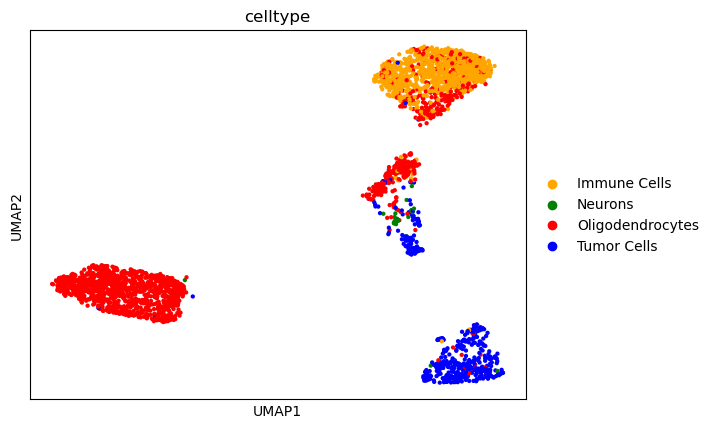

In [10]:
sc.pl.umap(gene_matrix, color = ["celltype"])

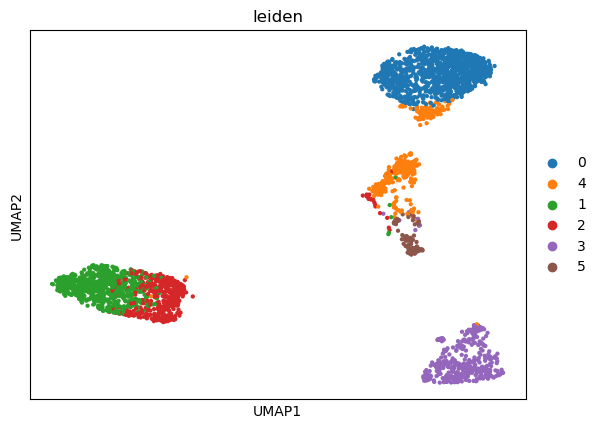

In [12]:
sc.pl.umap(gene_matrix, color = ["leiden"])

In [11]:
gene_matrix

AnnData object with n_obs × n_vars = 3142 × 60606
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden', 'celltype', 'UMAP of ATAC in BTROH01-Perimarginal', 'UMAP of ATAC in BTROH02-Perimarginal'
    uns: 'celltype_colors', 'leiden_colors'
    obsm: 'X_umap'

In [13]:
data = sc.read('/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT01/Aggregated/gene_matrix_annotationforperi2.h5ad')

In [14]:
data

AnnData object with n_obs × n_vars = 3142 × 60606
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden'
    uns: 'leiden_colors'
    obsm: 'X_umap'

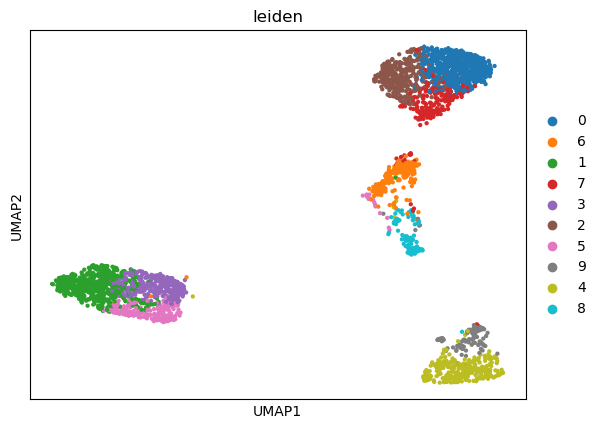

In [15]:
markers = ['leiden']
sc.pl.umap(data, use_raw=False, color= markers , ncols=2)

In [17]:
# Ensure 'leiden' column exists in data.obs
if 'leiden' in data.obs.columns:
    # Get the indices (cell names) where leiden == '4'
    tumor_cell_indices = data.obs.index[data.obs['leiden'] == '4']

    # Ensure 'celltype' is categorical and add "Tumor cells" to its categories
    if isinstance(gene_matrix.obs['celltype'].dtype, pd.CategoricalDtype):
        gene_matrix.obs['celltype'] = gene_matrix.obs['celltype'].cat.add_categories(['Tumor cells'])

    # Update the 'celltype' column for the selected cells
    gene_matrix.obs.loc[tumor_cell_indices, 'celltype'] = 'Tumor cells'

    print("Cells corresponding to leiden cluster '4' have been labeled as 'Tumor cells' in gene_matrix.")
else:
    print("Error: 'leiden' column not found in data.obs.")


Cells corresponding to leiden cluster '4' have been labeled as 'Tumor cells' in gene_matrix.


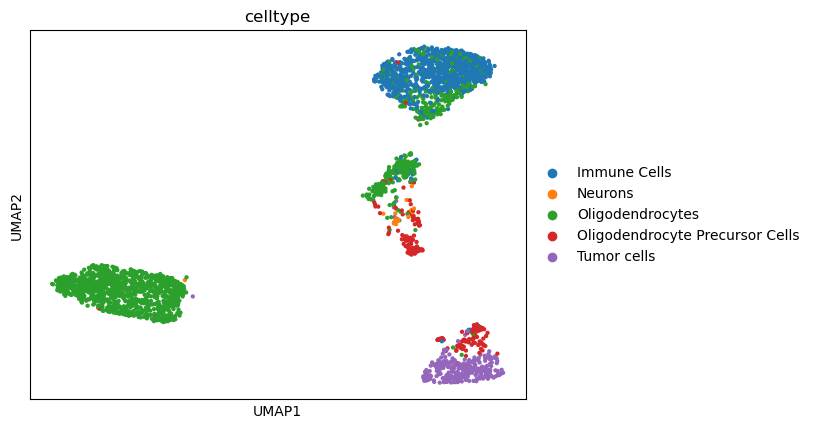

In [20]:
sc.pl.umap(gene_matrix, color = ["celltype"])

In [19]:
gene_matrix.obs['celltype'] = gene_matrix.obs['celltype'].replace("Tumor Cells", "Oligodendrocyte Precursor Cells")

In [ ]:
gene_matrix2=gene_matrix[gene_matrix.obs[gene_matrix.obs['leiden']=='4'].index, :]

In [22]:
!pwd

/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT02/Perimarginal


In [23]:
gene_matrix.write("/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT02/Perimarginal/BTROHT02_7_peri_gene_matrix_ANNOTATED_FINAL.h5ad")

In [ ]:
markers = ['leiden']
sc.pl.umap(gene_matrix, use_raw=False, color= markers , ncols=2)
gene_matrix2=gene_matrix[gene_matrix.obs[gene_matrix.obs['leiden']=='4'].index, :]
gene_matrix.obs_names

# Cluster from CONGAS 

In [10]:
gene_matrix=sc.read(f'{BASE_DIR}/BTROHT02_7_peri_gene_matrix_ANNOTATED_FINAL.h5ad')

In [11]:
gene_matrix

AnnData object with n_obs × n_vars = 3142 × 60606
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden', 'celltype', 'UMAP of ATAC in BTROH01-Perimarginal', 'UMAP of ATAC in BTROH02-Perimarginal'
    uns: 'celltype_colors', 'leiden_colors'
    obsm: 'X_umap'

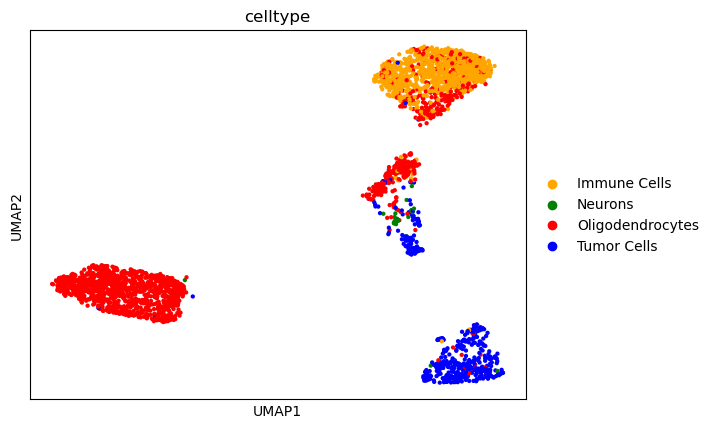

In [13]:
sc.pl.umap(gene_matrix, color='celltype')

In [14]:
clusters_from_congas=pd.read_csv(f'{BASE_DIR}/CONGAS/BTROHT02_peri_CONGAS_Clusters.csv', sep=',')
clusters_from_congas

,cell,cluster,modality,multiome_barcode
0,AAACATGCAACCCTCC-1-ATAC,C1,ATAC,AAACATGCAACCCTCC-1
1,AAACATGCAGTAAAGC-1-ATAC,C1,ATAC,AAACATGCAGTAAAGC-1
2,AAACCGAAGCGTGCGT-1-ATAC,C2,ATAC,AAACCGAAGCGTGCGT-1
3,AAACCGGCACAAAGCG-1-ATAC,C3,ATAC,AAACCGGCACAAAGCG-1
4,AAACGCGCAATGAATG-1-ATAC,C1,ATAC,AAACGCGCAATGAATG-1
...,...,...,...,...
6279,TTTGTGTTCGCACAAT-1-RNA,C1,RNA,TTTGTGTTCGCACAAT-1
6280,TTTGTTGGTAGGATTT-1-RNA,C4,RNA,TTTGTTGGTAGGATTT-1
6281,TTTGTTGGTCAAAGGG-1-RNA,C2,RNA,TTTGTTGGTCAAAGGG-1
6282,TTTGTTGGTTAGGCGT-1-RNA,C2,RNA,TTTGTTGGTTAGGCGT-1


In [15]:
clusters_from_congas=clusters_from_congas[clusters_from_congas['modality']=='ATAC']
clusters_from_congas=clusters_from_congas.set_index('multiome_barcode')
clusters_from_congas

,cell,cluster,modality
multiome_barcode,,,
AAACATGCAACCCTCC-1,AAACATGCAACCCTCC-1-ATAC,C1,ATAC
AAACATGCAGTAAAGC-1,AAACATGCAGTAAAGC-1-ATAC,C1,ATAC
AAACCGAAGCGTGCGT-1,AAACCGAAGCGTGCGT-1-ATAC,C2,ATAC
AAACCGGCACAAAGCG-1,AAACCGGCACAAAGCG-1-ATAC,C3,ATAC
AAACGCGCAATGAATG-1,AAACGCGCAATGAATG-1-ATAC,C1,ATAC
...,...,...,...
TTTGTGTTCGCACAAT-1,TTTGTGTTCGCACAAT-1-ATAC,C1,ATAC
TTTGTTGGTAGGATTT-1,TTTGTTGGTAGGATTT-1-ATAC,C4,ATAC
TTTGTTGGTCAAAGGG-1,TTTGTTGGTCAAAGGG-1-ATAC,C2,ATAC


In [16]:
gene_matrix.obs['congas_cluster']=clusters_from_congas.reindex(gene_matrix.obs_names)['cluster']

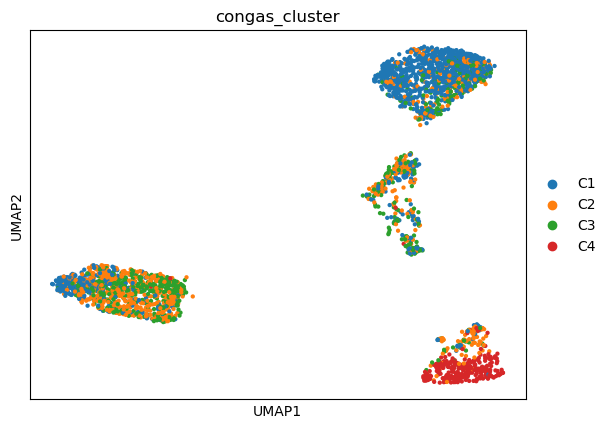

In [17]:
save_path='_ATAC_clusters_congas_all.pdf'
sc.pl.umap(gene_matrix, color=["congas_cluster"] , ncols=2, save=save_path)

In [ ]:
import os

# Define save directory and file name
save_dir = "./results"  # Adjust to your desired directory
os.makedirs(save_dir, exist_ok=True)  # Create the directory if it doesn't exist
save_path = os.path.join(save_dir, "ATAC_clusters_congas_all.pdf")

# Save the plot
sc.pl.umap(gene_matrix, color=["congas_cluster"], ncols=2, save="ATAC_clusters_congas_all.pdf")


# Finalizing the annotation (edited version after comgas) 

In [9]:
data = sc.read(f'{BASE_DIR}/BTROHT02_5_peri_rna_ANNOTATED_FINAL.h5ad')

In [10]:
data

AnnData object with n_obs × n_vars = 3156 × 36588
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex', 'cell_typist_predicted_labels_Adult_Human_PrefrontalCortex', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'celltypist_conf_score_Adult_Human_PrefrontalCortex', 'cnv_raw_l1', 'cnv_raw_l2', 'cnv_score', 'cnv_leiden', 'celltype', 'UMAP of Gene Expression in BTROHT02-Perimarginal', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'UMAP of Gene Expression in BTROHT02-Perimarginal_colors', 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex_colors', 'cell_typist_predicted_labels_Adult_Human_PrefrontalCortex_colors', 'celltype_colors', 'cnv_leiden_colors

In [17]:
data.obs["celltype"]

KeyError: 'key of type tuple not found and not a MultiIndex'

In [11]:
Peri_annofromatac = sc.read('/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT01/Aggregated/gene_matrix_annotationforperi2.h5ad')

In [12]:
Peri_annofromatac

AnnData object with n_obs × n_vars = 3142 × 60606
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'leiden'
    uns: 'leiden_colors'
    obsm: 'X_umap'

In [20]:
print(type(Peri_annofromatac.obs["leiden"]))
print(Peri_annofromatac.obs["leiden"].dtype)


<class 'pandas.core.series.Series'>
category


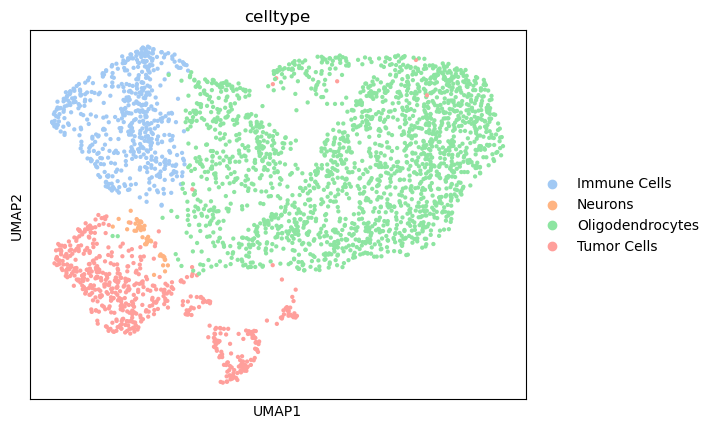

In [26]:
sc.pl.umap(data, color =["celltype"])

In [23]:
data.obs['celltype']

AAACATGCACTAAGAA-1    Oligodendrocytes
AAACATGCAGTAAAGC-1        Immune Cells
AAACCAACATGTCGCG-1    Oligodendrocytes
AAACCGCGTAGTCAAT-1    Oligodendrocytes
AAACCGGCACAAAGCG-1    Oligodendrocytes
                            ...       
TTTGTGGCACACTAAT-1    Oligodendrocytes
TTTGTGTTCGCACAAT-1    Oligodendrocytes
TTTGTTGGTAGGATTT-1         Tumor Cells
TTTGTTGGTTAGGCGT-1    Oligodendrocytes
TTTGTTGGTTGGTTAG-1    Oligodendrocytes
Name: celltype, Length: 3156, dtype: category
Categories (4, object): ['Immune Cells', 'Neurons', 'Oligodendrocytes', 'Tumor Cells']

In [27]:
data.obs["celltype"] = data.obs["celltype"].replace("Tumor Cells", "Unknown")

In [28]:
data.obs['celltype']

AAACATGCACTAAGAA-1    Oligodendrocytes
AAACATGCAGTAAAGC-1        Immune Cells
AAACCAACATGTCGCG-1    Oligodendrocytes
AAACCGCGTAGTCAAT-1    Oligodendrocytes
AAACCGGCACAAAGCG-1    Oligodendrocytes
                            ...       
TTTGTGGCACACTAAT-1    Oligodendrocytes
TTTGTGTTCGCACAAT-1    Oligodendrocytes
TTTGTTGGTAGGATTT-1             Unknown
TTTGTTGGTTAGGCGT-1    Oligodendrocytes
TTTGTTGGTTGGTTAG-1    Oligodendrocytes
Name: celltype, Length: 3156, dtype: category
Categories (4, object): ['Immune Cells', 'Neurons', 'Oligodendrocytes', 'Unknown']

In [29]:
common_indices = data.obs.index.intersection(Peri_annofromatac.obs.index)
mask = Peri_annofromatac.obs.loc[common_indices, "leiden"] == "4"
data.obs.loc[common_indices[mask], "celltype"] = "Tumor Cells"


TypeError: Cannot setitem on a Categorical with a new category (Tumor Cells), set the categories first

In [30]:
# Ensure "Tumor Cells" is part of the category list
data.obs["celltype"] = data.obs["celltype"].astype("category")  # Ensure it's categorical
data.obs["celltype"] = data.obs["celltype"].cat.add_categories(["Tumor Cells"])  # Add missing category

# Now you can assign the new cell type
common_indices = data.obs.index.intersection(Peri_annofromatac.obs.index)
mask = Peri_annofromatac.obs.loc[common_indices, "leiden"] == "4"
data.obs.loc[common_indices[mask], "celltype"] = "Tumor Cells"


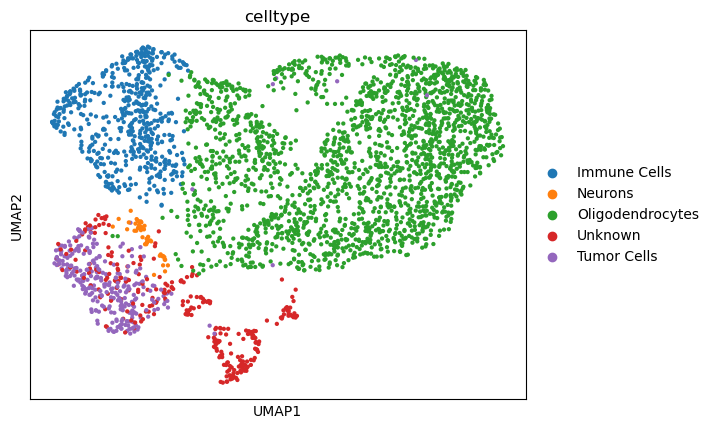

In [31]:
sc.pl.umap(data , color = ["celltype"])

In [32]:
data.obs["celltype"] = data.obs["celltype"].replace("Unknown", "Oligocendrocyte precursor cells")

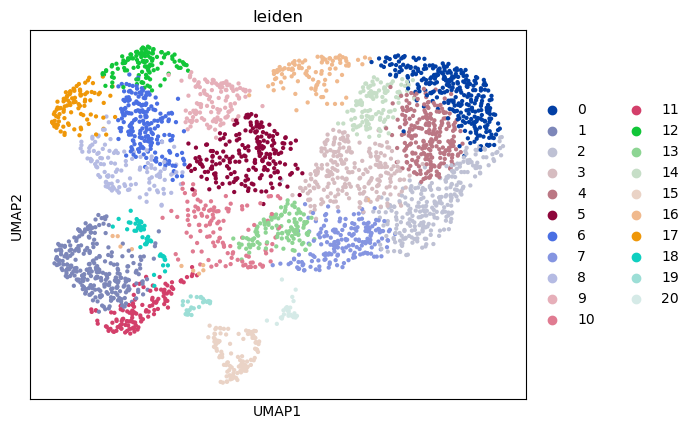

In [34]:
sc.pl.umap(data , color = ["leiden"])

In [37]:
data.obs.loc[data.obs["leiden"] == "11", "celltype"] = "Tumor Cells"

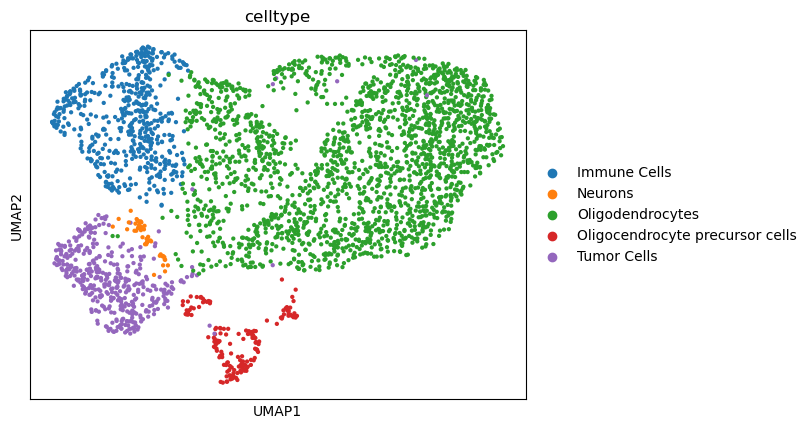

In [38]:
sc.pl.umap(data , color = ["celltype"])

In [39]:
data

AnnData object with n_obs × n_vars = 3156 × 36588
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex', 'cell_typist_predicted_labels_Adult_Human_PrefrontalCortex', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'celltypist_conf_score_Adult_Human_PrefrontalCortex', 'cnv_raw_l1', 'cnv_raw_l2', 'cnv_score', 'cnv_leiden', 'celltype', 'UMAP of Gene Expression in BTROHT02-Perimarginal', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'UMAP of Gene Expression in BTROHT02-Perimarginal_colors', 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex_colors', 'cell_typist_predicted_labels_Adult_Human_PrefrontalCortex_colors', 'celltype_colors', 'cnv_leiden_colors

In [42]:
BASE_DIR

'/home/fatemeh.nasrabadi/ROVIGO_congas/BTROHT02/Perimarginal'

In [43]:
data.write(f'{BASE_DIR}/BTROHT04_5_peri_rna_ANNOTATED_FINAL_afterCONGAS.h5ad')